# Análise da Relação Educação-Trabalho na produtividade nos NUTSII
##### Damião Goes 25494 
##### Miguel Gonçalves Ferreira 23382

## Bibliotecas e Preparação de Dados

#### Bibliotecas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import scipy.cluster.hierarchy as sch
from statsmodels.formula.api import ols


#### Criação de tabelas

In [2]:
# Path to your CSV file
csvNorte = 'tabela_Norte.csv'
csvAlgarve = 'tabela_Algarve.csv'
csvAlentejo = 'tabela_Alentejo.csv'
csvAMLisboa = 'tabela_AMLisboa.csv'
csvCentro = 'tabela_Centro.csv'
csvPortugal = 'tabela_variaveis.csv'

# Read the CSV file into a DataFrame
dfAlgarve = pd.read_csv(csvAlgarve)
dfAlentejo = pd.read_csv(csvAlentejo)
dfAMLisboa = pd.read_csv(csvAMLisboa)
dfCentro = pd.read_csv(csvCentro)
dfNorte = pd.read_csv(csvNorte)
dfPortugal = pd.read_csv(csvPortugal)

In [3]:
print(dfAlgarve.columns)

Index(['NutsID', 'DICOFRE', 'region_name', 'year', 'edu_none', 'edu_basic',
       'edu_secondary', 'edu_superior', 'labour_family', 'labour_holder',
       'labour_spouse', 'labour_other_family', 'labour_non_family',
       'labour_regular', 'labour_non_regular', 'labour_not_hired',
       'production_eur', 'production_area'],
      dtype='object')


#### Organização dos dados (soma das variáveis)

In [4]:
# Paths to your CSV files
csv_paths = {
    'Norte': 'tabela_Norte.csv',
    'Algarve': 'tabela_Algarve.csv',
    'Alentejo': 'tabela_Alentejo.csv',
    'AMLisboa': 'tabela_AMLisboa.csv',
    'Centro': 'tabela_Centro.csv',
    'Portugal': 'tabela_variaveis.csv'
}

# Dictionary to hold the summed DataFrames
summed_dataframes = {}

# Function to read CSV, drop specified columns, group by year, and sum the values
def read_drop_sum_save(path, region):
    df = pd.read_csv(path)
    df = df.drop(columns=['NutsID', 'DICOFRE', 'region_name'])
    df_summed = df.groupby('year').sum().reset_index()
    df_summed.to_csv(f'{region}_sum.csv', index=False)
    return df_summed

# Read each CSV file, process it, and store the result in the dictionary
for region, path in csv_paths.items():
    summed_dataframes[region] = read_drop_sum_save(path, region)

# Display the first few rows of each summed DataFrame to verify
for region, df in summed_dataframes.items():
    print(f"Summed DataFrame for {region}:")
    print(df.head())
    print()





Summed DataFrame for Norte:
   year  edu_none  edu_basic  edu_secondary  edu_superior  labour_family  \
0  1999    149871     255501          24646         15385         174396   
1  2009     69131     187486          24997         20503         127171   
2  2019     31554     161233          35410         29521          93420   

   labour_holder  labour_spouse  labour_other_family  labour_non_family  \
0          81799          52927                39828              29759   
1          65740          40079                21488              21011   
2          50102          28189                15293              26097   

   labour_regular  labour_non_regular  labour_not_hired  production_eur  \
0           12196               16418              1117    1.103822e+09   
1            9802               10120               915    9.276839e+08   
2           12557               11176              2288    1.312536e+09   

   production_area  
0        3819703.7  
1        3622406.4  
2 

## Estatistica descritiva 

#### Alentejo

                     count          mean           std           min  \
year                   3.0  2.009000e+03  1.000000e+01  1.999000e+03   
edu_none               3.0  2.275233e+04  1.666540e+04  8.383000e+03   
edu_basic              3.0  5.704700e+04  1.445124e+04  4.334900e+04   
edu_secondary          3.0  1.079400e+04  1.460543e+03  9.715000e+03   
edu_superior           3.0  9.186000e+03  2.106400e+03  7.569000e+03   
labour_family          3.0  2.689800e+04  8.800033e+03  1.988900e+04   
labour_holder          3.0  1.700733e+04  5.060431e+03  1.301300e+04   
labour_spouse          3.0  6.575667e+03  2.868913e+03  4.185000e+03   
labour_other_family    3.0  3.348000e+03  8.690725e+02  2.726000e+03   
labour_non_family      3.0  2.842067e+04  5.482812e+03  2.384800e+04   
labour_regular         3.0  1.754967e+04  3.808605e+03  1.499400e+04   
labour_non_regular     3.0  8.714333e+03  1.770722e+03  7.003000e+03   
labour_not_hired       3.0  2.175667e+03  1.686953e+03  6.650000

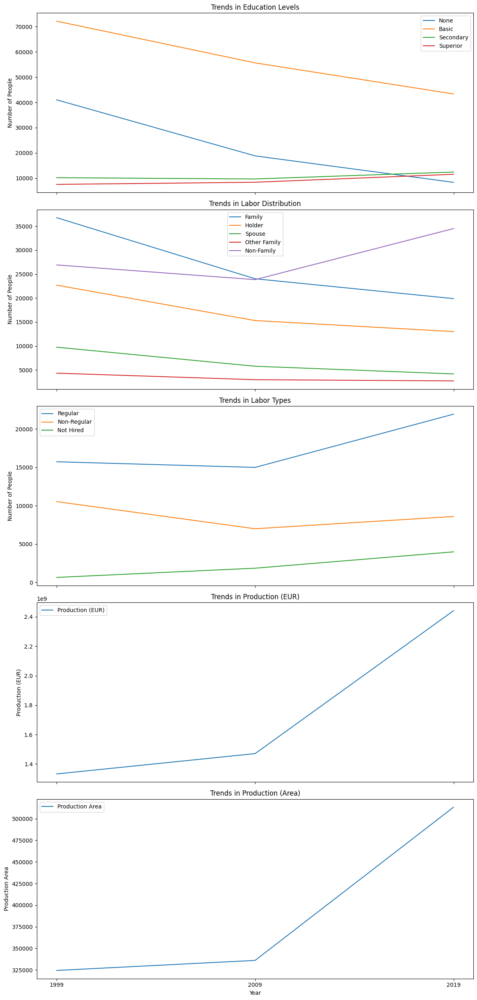

In [11]:
# Load the data
file_path = 'Alentejo_sum.csv'
data = pd.read_csv(file_path)


# Calculate descriptive statistics for each numerical column
descriptive_stats = data.describe().transpose()

# Calculate mode separately as it's not included in the describe() method
modes = data.mode().iloc[0]

# Adding mode to the descriptive statistics
descriptive_stats['mode'] = modes

# Adding variance to the descriptive statistics
descriptive_stats['variance'] = data.var()

# Display the descriptive statistics
print(descriptive_stats)

# Setting up subplots for each category to visualize trends over time
fig, axs = plt.subplots(5, 1, figsize=(12, 25), sharex=True)

# Plotting trends in education levels
axs[0].plot(data['year'], data[['edu_none', 'edu_basic', 'edu_secondary', 'edu_superior']])
axs[0].set_title('Trends in Education Levels')
axs[0].set_ylabel('Number of People')
axs[0].legend(['None', 'Basic', 'Secondary', 'Superior'])

# Plotting trends in labor distribution
axs[1].plot(data['year'], data[['labour_family', 'labour_holder', 'labour_spouse', 'labour_other_family', 'labour_non_family']])
axs[1].set_title('Trends in Labor Distribution')
axs[1].set_ylabel('Number of People')
axs[1].legend(['Family', 'Holder', 'Spouse', 'Other Family', 'Non-Family'])

# Plotting trends in regular vs non-regular labor
axs[2].plot(data['year'], data[['labour_regular', 'labour_non_regular', 'labour_not_hired']])
axs[2].set_title('Trends in Labor Types')
axs[2].set_ylabel('Number of People')
axs[2].legend(['Regular', 'Non-Regular', 'Not Hired'])

# Plotting trends in production (EUR)
axs[3].plot(data['year'], data['production_eur'], label='Production (EUR)')
axs[3].set_title('Trends in Production (EUR)')
axs[3].set_ylabel('Production (EUR)')
axs[3].legend()

# Plotting trends in production (Area)
axs[4].plot(data['year'], data['production_area'], label='Production Area')
axs[4].set_title('Trends in Production (Area)')
axs[4].set_xlabel('Year')
axs[4].set_ylabel('Production Area')
axs[4].legend()

# Setting x-ticks to be the years present in the dataset
for ax in axs:
    ax.set_xticks(data['year'])
    ax.set_xticklabels(data['year'])

plt.tight_layout()
plt.show()




#### Algarve

                     count          mean           std          min  \
year                   3.0  2.009000e+03  1.000000e+01       1999.0   
edu_none               3.0  9.168000e+03  7.071901e+03       3357.0   
edu_basic              3.0  2.011767e+04  4.970590e+03      16943.0   
edu_secondary          3.0  3.300000e+03  7.201333e+02       2588.0   
edu_superior           3.0  2.314667e+03  7.652093e+02       1800.0   
labour_family          3.0  9.902000e+03  3.363220e+03       7134.0   
labour_holder          3.0  5.918000e+03  1.945919e+03       4342.0   
labour_spouse          3.0  2.622667e+03  1.107819e+03       1649.0   
labour_other_family    3.0  1.372000e+03  3.159177e+02       1152.0   
labour_non_family      3.0  4.130333e+03  2.160670e+03       2508.0   
labour_regular         3.0  2.513333e+03  1.091091e+03       1717.0   
labour_non_regular     3.0  9.053333e+02  2.771359e+02        606.0   
labour_not_hired       3.0  7.156667e+02  1.005159e+03         88.0   
produc

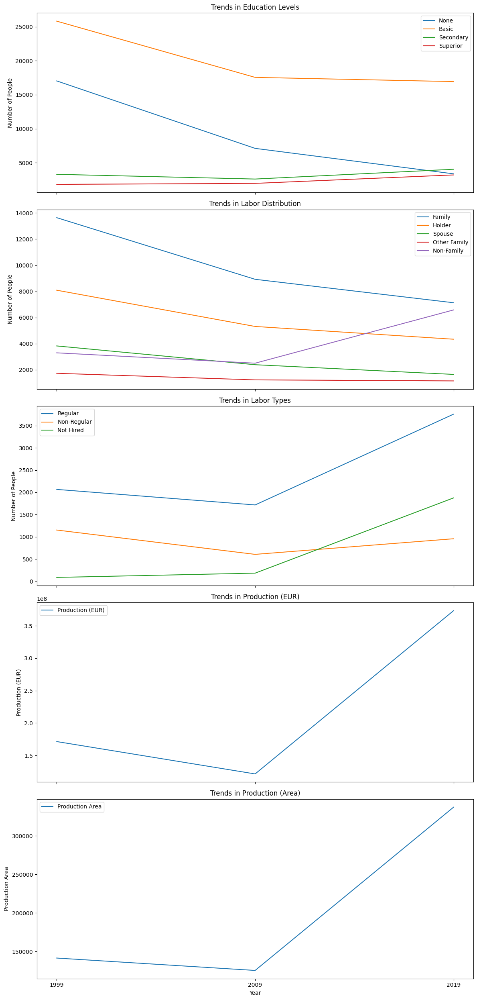

In [12]:
# Load the data
file_path = 'Algarve_sum.csv'
data = pd.read_csv(file_path)


# Calculate descriptive statistics for each numerical column
descriptive_stats = data.describe().transpose()

# Calculate mode separately as it's not included in the describe() method
modes = data.mode().iloc[0]

# Adding mode to the descriptive statistics
descriptive_stats['mode'] = modes

# Adding variance to the descriptive statistics
descriptive_stats['variance'] = data.var()

# Display the descriptive statistics
print(descriptive_stats)

# Setting up subplots for each category to visualize trends over time
fig, axs = plt.subplots(5, 1, figsize=(12, 25), sharex=True)

# Plotting trends in education levels
axs[0].plot(data['year'], data[['edu_none', 'edu_basic', 'edu_secondary', 'edu_superior']])
axs[0].set_title('Trends in Education Levels')
axs[0].set_ylabel('Number of People')
axs[0].legend(['None', 'Basic', 'Secondary', 'Superior'])

# Plotting trends in labor distribution
axs[1].plot(data['year'], data[['labour_family', 'labour_holder', 'labour_spouse', 'labour_other_family', 'labour_non_family']])
axs[1].set_title('Trends in Labor Distribution')
axs[1].set_ylabel('Number of People')
axs[1].legend(['Family', 'Holder', 'Spouse', 'Other Family', 'Non-Family'])

# Plotting trends in regular vs non-regular labor
axs[2].plot(data['year'], data[['labour_regular', 'labour_non_regular', 'labour_not_hired']])
axs[2].set_title('Trends in Labor Types')
axs[2].set_ylabel('Number of People')
axs[2].legend(['Regular', 'Non-Regular', 'Not Hired'])

# Plotting trends in production (EUR)
axs[3].plot(data['year'], data['production_eur'], label='Production (EUR)')
axs[3].set_title('Trends in Production (EUR)')
axs[3].set_ylabel('Production (EUR)')
axs[3].legend()

# Plotting trends in production (Area)
axs[4].plot(data['year'], data['production_area'], label='Production Area')
axs[4].set_title('Trends in Production (Area)')
axs[4].set_xlabel('Year')
axs[4].set_ylabel('Production Area')
axs[4].legend()

# Setting x-ticks to be the years present in the dataset
for ax in axs:
    ax.set_xticks(data['year'])
    ax.set_xticklabels(data['year'])

plt.tight_layout()
plt.show()

#### AMLisboa

                     count          mean           std          min  \
year                   3.0  2.009000e+03  1.000000e+01       1999.0   
edu_none               3.0  4.940000e+03  4.516129e+03       1283.0   
edu_basic              3.0  1.326533e+04  5.355703e+03       8744.0   
edu_secondary          3.0  1.941667e+03  4.012235e+02       1486.0   
edu_superior           3.0  1.211667e+03  1.931045e+02       1015.0   
labour_family          3.0  7.740667e+03  3.940501e+03       4313.0   
labour_holder          3.0  4.456000e+03  2.029431e+03       2688.0   
labour_spouse          3.0  2.217667e+03  1.281921e+03       1098.0   
labour_other_family    3.0  1.069333e+03  6.314945e+02        530.0   
labour_non_family      3.0  4.441333e+03  9.242750e+02       3417.0   
labour_regular         3.0  3.006333e+03  5.896493e+02       2464.0   
labour_non_regular     3.0  1.198000e+03  4.361238e+02        896.0   
labour_not_hired       3.0  2.293333e+02  2.951090e+02         52.0   
produc

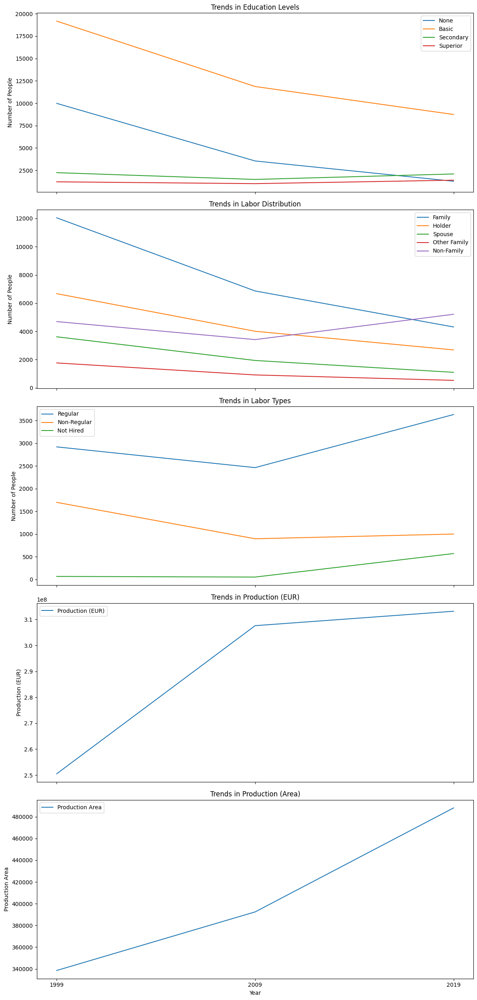

In [13]:
# Load the data
file_path = 'AMLisboa_sum.csv'
data = pd.read_csv(file_path)


# Calculate descriptive statistics for each numerical column
descriptive_stats = data.describe().transpose()

# Calculate mode separately as it's not included in the describe() method
modes = data.mode().iloc[0]

# Adding mode to the descriptive statistics
descriptive_stats['mode'] = modes

# Adding variance to the descriptive statistics
descriptive_stats['variance'] = data.var()

# Display the descriptive statistics
print(descriptive_stats)

# Setting up subplots for each category to visualize trends over time
fig, axs = plt.subplots(5, 1, figsize=(12, 25), sharex=True)

# Plotting trends in education levels
axs[0].plot(data['year'], data[['edu_none', 'edu_basic', 'edu_secondary', 'edu_superior']])
axs[0].set_title('Trends in Education Levels')
axs[0].set_ylabel('Number of People')
axs[0].legend(['None', 'Basic', 'Secondary', 'Superior'])

# Plotting trends in labor distribution
axs[1].plot(data['year'], data[['labour_family', 'labour_holder', 'labour_spouse', 'labour_other_family', 'labour_non_family']])
axs[1].set_title('Trends in Labor Distribution')
axs[1].set_ylabel('Number of People')
axs[1].legend(['Family', 'Holder', 'Spouse', 'Other Family', 'Non-Family'])

# Plotting trends in regular vs non-regular labor
axs[2].plot(data['year'], data[['labour_regular', 'labour_non_regular', 'labour_not_hired']])
axs[2].set_title('Trends in Labor Types')
axs[2].set_ylabel('Number of People')
axs[2].legend(['Regular', 'Non-Regular', 'Not Hired'])

# Plotting trends in production (EUR)
axs[3].plot(data['year'], data['production_eur'], label='Production (EUR)')
axs[3].set_title('Trends in Production (EUR)')
axs[3].set_ylabel('Production (EUR)')
axs[3].legend()

# Plotting trends in production (Area)
axs[4].plot(data['year'], data['production_area'], label='Production Area')
axs[4].set_title('Trends in Production (Area)')
axs[4].set_xlabel('Year')
axs[4].set_ylabel('Production Area')
axs[4].legend()

# Setting x-ticks to be the years present in the dataset
for ax in axs:
    ax.set_xticks(data['year'])
    ax.set_xticklabels(data['year'])

plt.tight_layout()
plt.show()

#### Centro

                     count          mean           std           min  \
year                   3.0  2.009000e+03  1.000000e+01  1.999000e+03   
edu_none               3.0  7.760367e+04  6.571427e+04  2.453300e+04   
edu_basic              3.0  1.958760e+05  6.559896e+04  1.457390e+05   
edu_secondary          3.0  2.774100e+04  4.379830e+03  2.286900e+04   
edu_superior           3.0  1.851400e+04  4.189924e+03  1.606700e+04   
labour_family          3.0  1.166150e+05  5.040005e+04  7.239700e+04   
labour_holder          3.0  6.139567e+04  2.385958e+04  3.996300e+04   
labour_spouse          3.0  3.957900e+04  1.924922e+04  2.254900e+04   
labour_other_family    3.0  1.573667e+04  7.358650e+03  9.985000e+03   
labour_non_family      3.0  2.212067e+04  3.662140e+03  1.791500e+04   
labour_regular         3.0  1.218267e+04  2.782434e+03  1.006500e+04   
labour_non_regular     3.0  9.092667e+03  3.130496e+03  7.236000e+03   
labour_not_hired       3.0  8.196667e+02  3.884332e+02  4.670000

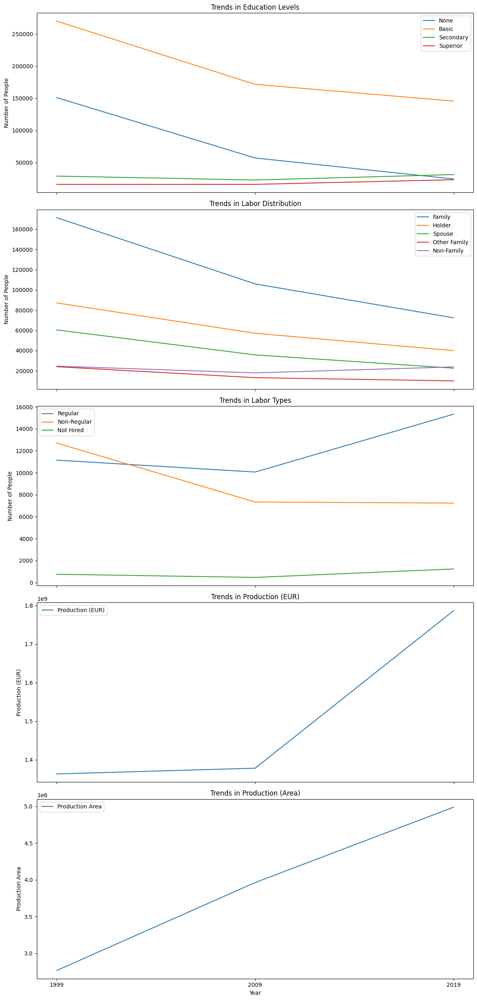

In [14]:
# Load the data
file_path = 'Centro_sum.csv'
data = pd.read_csv(file_path)


# Calculate descriptive statistics for each numerical column
descriptive_stats = data.describe().transpose()

# Calculate mode separately as it's not included in the describe() method
modes = data.mode().iloc[0]

# Adding mode to the descriptive statistics
descriptive_stats['mode'] = modes

# Adding variance to the descriptive statistics
descriptive_stats['variance'] = data.var()

# Display the descriptive statistics
print(descriptive_stats)

# Setting up subplots for each category to visualize trends over time
fig, axs = plt.subplots(5, 1, figsize=(12, 25), sharex=True)

# Plotting trends in education levels
axs[0].plot(data['year'], data[['edu_none', 'edu_basic', 'edu_secondary', 'edu_superior']])
axs[0].set_title('Trends in Education Levels')
axs[0].set_ylabel('Number of People')
axs[0].legend(['None', 'Basic', 'Secondary', 'Superior'])

# Plotting trends in labor distribution
axs[1].plot(data['year'], data[['labour_family', 'labour_holder', 'labour_spouse', 'labour_other_family', 'labour_non_family']])
axs[1].set_title('Trends in Labor Distribution')
axs[1].set_ylabel('Number of People')
axs[1].legend(['Family', 'Holder', 'Spouse', 'Other Family', 'Non-Family'])

# Plotting trends in regular vs non-regular labor
axs[2].plot(data['year'], data[['labour_regular', 'labour_non_regular', 'labour_not_hired']])
axs[2].set_title('Trends in Labor Types')
axs[2].set_ylabel('Number of People')
axs[2].legend(['Regular', 'Non-Regular', 'Not Hired'])

# Plotting trends in production (EUR)
axs[3].plot(data['year'], data['production_eur'], label='Production (EUR)')
axs[3].set_title('Trends in Production (EUR)')
axs[3].set_ylabel('Production (EUR)')
axs[3].legend()

# Plotting trends in production (Area)
axs[4].plot(data['year'], data['production_area'], label='Production Area')
axs[4].set_title('Trends in Production (Area)')
axs[4].set_xlabel('Year')
axs[4].set_ylabel('Production Area')
axs[4].legend()

# Setting x-ticks to be the years present in the dataset
for ax in axs:
    ax.set_xticks(data['year'])
    ax.set_xticklabels(data['year'])

plt.tight_layout()
plt.show()

#### Norte

                     count          mean           std          min  \
year                   3.0  2.009000e+03  1.000000e+01       1999.0   
edu_none               3.0  8.351867e+04  6.045645e+04      31554.0   
edu_basic              3.0  2.014067e+05  4.865134e+04     161233.0   
edu_secondary          3.0  2.835100e+04  6.115792e+03      24646.0   
edu_superior           3.0  2.180300e+04  7.157103e+03      15385.0   
labour_family          3.0  1.316623e+05  4.067440e+04      93420.0   
labour_holder          3.0  6.588033e+04  1.584897e+04      50102.0   
labour_spouse          3.0  4.039833e+04  1.237209e+04      28189.0   
labour_other_family    3.0  2.553633e+04  1.275866e+04      15293.0   
labour_non_family      3.0  2.562233e+04  4.393274e+03      21011.0   
labour_regular         3.0  1.151833e+04  1.497308e+03       9802.0   
labour_non_regular     3.0  1.257133e+04  3.372895e+03      10120.0   
labour_not_hired       3.0  1.440000e+03  7.413022e+02        915.0   
produc

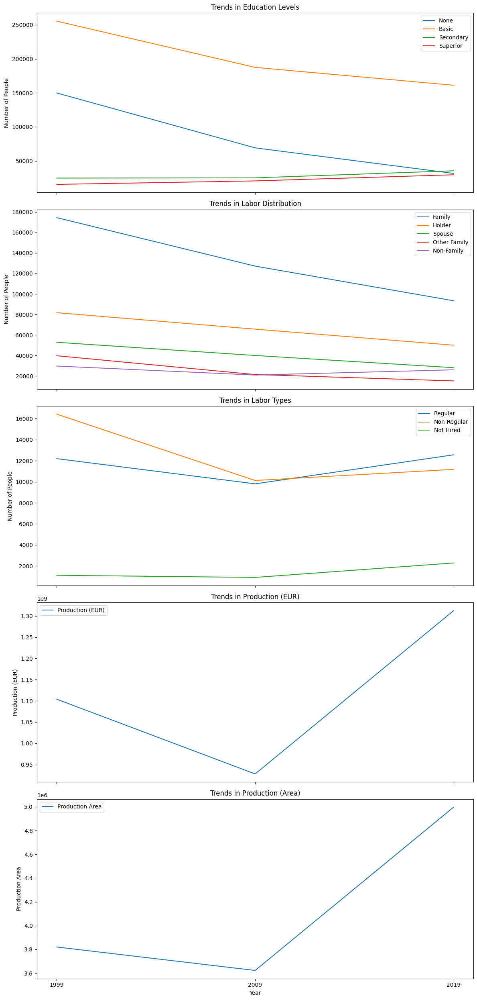

In [15]:
# Load the data
file_path = 'Norte_sum.csv'
data = pd.read_csv(file_path)


# Calculate descriptive statistics for each numerical column
descriptive_stats = data.describe().transpose()

# Calculate mode separately as it's not included in the describe() method
modes = data.mode().iloc[0]

# Adding mode to the descriptive statistics
descriptive_stats['mode'] = modes

# Adding variance to the descriptive statistics
descriptive_stats['variance'] = data.var()

# Display the descriptive statistics
print(descriptive_stats)

# Setting up subplots for each category to visualize trends over time
fig, axs = plt.subplots(5, 1, figsize=(12, 25), sharex=True)

# Plotting trends in education levels
axs[0].plot(data['year'], data[['edu_none', 'edu_basic', 'edu_secondary', 'edu_superior']])
axs[0].set_title('Trends in Education Levels')
axs[0].set_ylabel('Number of People')
axs[0].legend(['None', 'Basic', 'Secondary', 'Superior'])

# Plotting trends in labor distribution
axs[1].plot(data['year'], data[['labour_family', 'labour_holder', 'labour_spouse', 'labour_other_family', 'labour_non_family']])
axs[1].set_title('Trends in Labor Distribution')
axs[1].set_ylabel('Number of People')
axs[1].legend(['Family', 'Holder', 'Spouse', 'Other Family', 'Non-Family'])

# Plotting trends in regular vs non-regular labor
axs[2].plot(data['year'], data[['labour_regular', 'labour_non_regular', 'labour_not_hired']])
axs[2].set_title('Trends in Labor Types')
axs[2].set_ylabel('Number of People')
axs[2].legend(['Regular', 'Non-Regular', 'Not Hired'])

# Plotting trends in production (EUR)
axs[3].plot(data['year'], data['production_eur'], label='Production (EUR)')
axs[3].set_title('Trends in Production (EUR)')
axs[3].set_ylabel('Production (EUR)')
axs[3].legend()

# Plotting trends in production (Area)
axs[4].plot(data['year'], data['production_area'], label='Production Area')
axs[4].set_title('Trends in Production (Area)')
axs[4].set_xlabel('Year')
axs[4].set_ylabel('Production Area')
axs[4].legend()

# Setting x-ticks to be the years present in the dataset
for ax in axs:
    ax.set_xticks(data['year'])
    ax.set_xticklabels(data['year'])

plt.tight_layout()
plt.show()

#### Portugal

                     count          mean           std           min  \
year                   3.0  2.009000e+03  1.000000e+01  1.999000e+03   
edu_none               3.0  1.979827e+05  1.543439e+05  6.911000e+04   
edu_basic              3.0  4.877127e+05  1.385808e+05  3.760080e+05   
edu_secondary          3.0  7.212767e+04  1.207982e+04  6.165500e+04   
edu_superior           3.0  5.302933e+04  1.418014e+04  4.204000e+04   
labour_family          3.0  2.928180e+05  1.069929e+05  1.971530e+05   
labour_holder          3.0  1.546573e+05  4.852672e+04  1.101080e+05   
labour_spouse          3.0  9.139333e+04  3.676804e+04  5.767000e+04   
labour_other_family    3.0  4.706233e+04  2.192514e+04  2.968600e+04   
labour_non_family      3.0  8.473533e+04  1.431736e+04  6.869900e+04   
labour_regular         3.0  4.677033e+04  9.381866e+03  3.904200e+04   
labour_non_regular     3.0  3.248167e+04  8.818495e+03  2.596000e+04   
labour_not_hired       3.0  5.380333e+03  3.990137e+03  2.692000

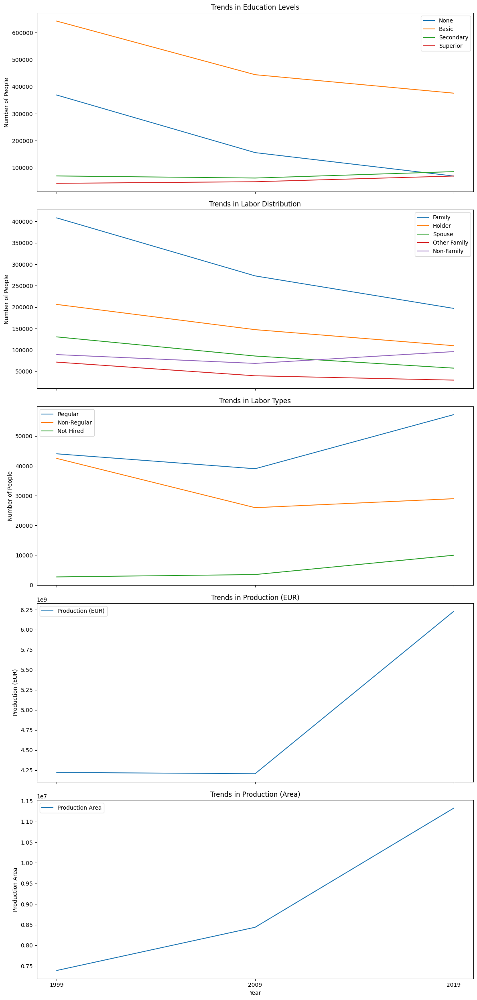

In [9]:
# Load the data
file_path = 'Portugal_sum.csv'
data = pd.read_csv(file_path)


# Calculate descriptive statistics for each numerical column
descriptive_stats = data.describe().transpose()

# Calculate mode separately as it's not included in the describe() method
modes = data.mode().iloc[0]

# Adding mode to the descriptive statistics
descriptive_stats['mode'] = modes

# Adding variance to the descriptive statistics
descriptive_stats['variance'] = data.var()

# Display the descriptive statistics
print(descriptive_stats)

# Setting up subplots for each category to visualize trends over time
fig, axs = plt.subplots(5, 1, figsize=(12, 25), sharex=True)

# Plotting trends in education levels
axs[0].plot(data['year'], data[['edu_none', 'edu_basic', 'edu_secondary', 'edu_superior']])
axs[0].set_title('Trends in Education Levels')
axs[0].set_ylabel('Number of People')
axs[0].legend(['None', 'Basic', 'Secondary', 'Superior'])

# Plotting trends in labor distribution
axs[1].plot(data['year'], data[['labour_family', 'labour_holder', 'labour_spouse', 'labour_other_family', 'labour_non_family']])
axs[1].set_title('Trends in Labor Distribution')
axs[1].set_ylabel('Number of People')
axs[1].legend(['Family', 'Holder', 'Spouse', 'Other Family', 'Non-Family'])

# Plotting trends in regular vs non-regular labor
axs[2].plot(data['year'], data[['labour_regular', 'labour_non_regular', 'labour_not_hired']])
axs[2].set_title('Trends in Labor Types')
axs[2].set_ylabel('Number of People')
axs[2].legend(['Regular', 'Non-Regular', 'Not Hired'])

# Plotting trends in production (EUR)
axs[3].plot(data['year'], data['production_eur'], label='Production (EUR)')
axs[3].set_title('Trends in Production (EUR)')
axs[3].set_ylabel('Production (EUR)')
axs[3].legend()

# Plotting trends in production (Area)
axs[4].plot(data['year'], data['production_area'], label='Production Area')
axs[4].set_title('Trends in Production (Area)')
axs[4].set_xlabel('Year')
axs[4].set_ylabel('Production Area')
axs[4].legend()

# Setting x-ticks to be the years present in the dataset
for ax in axs:
    ax.set_xticks(data['year'])
    ax.set_xticklabels(data['year'])

plt.tight_layout()
plt.show()

#### Pairwise

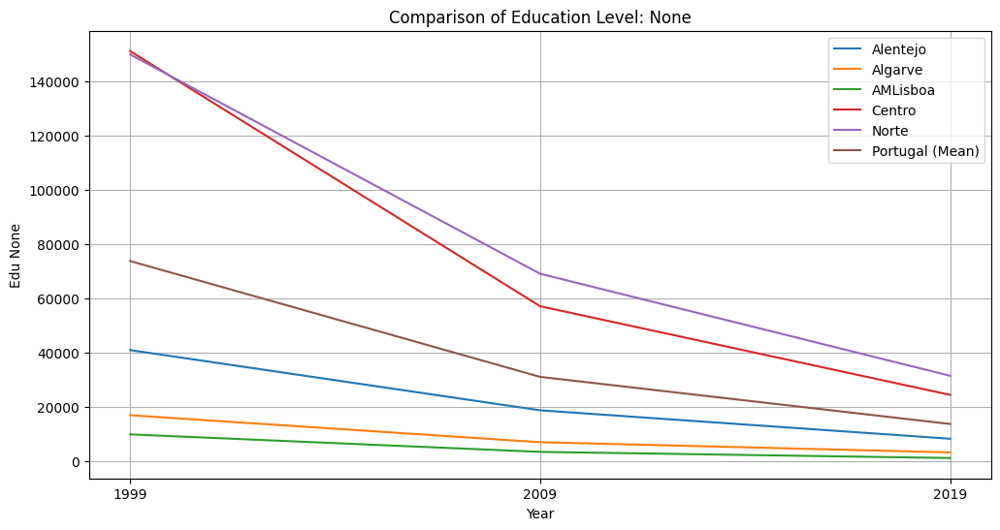

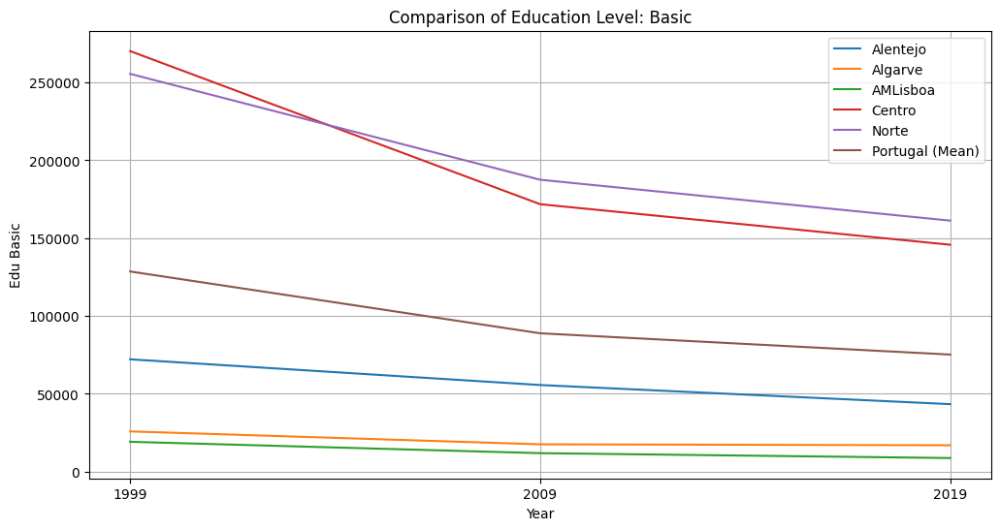

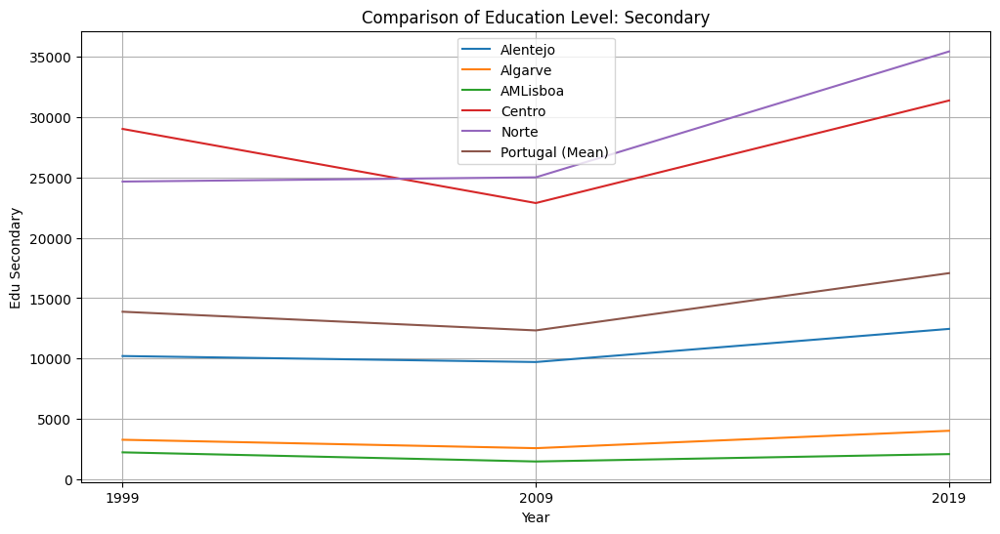

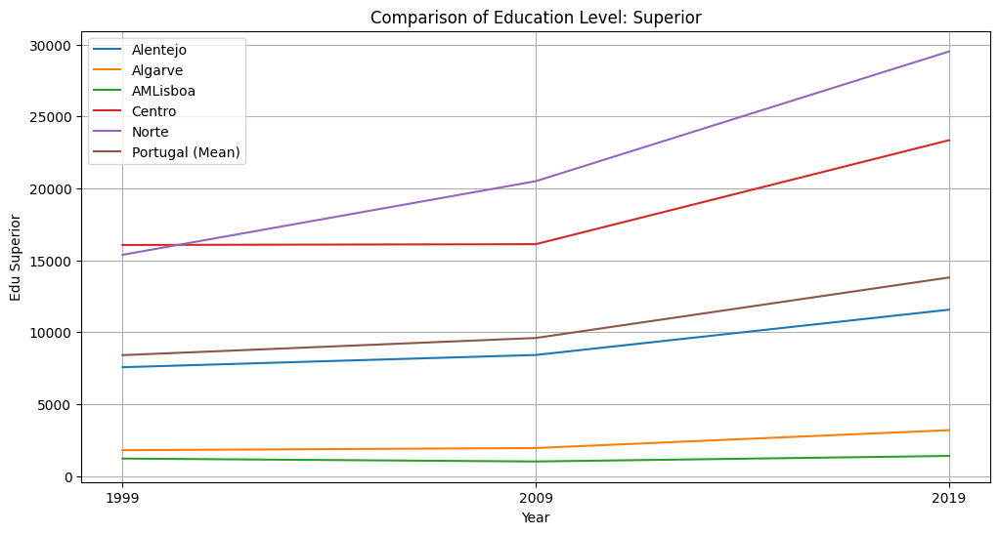

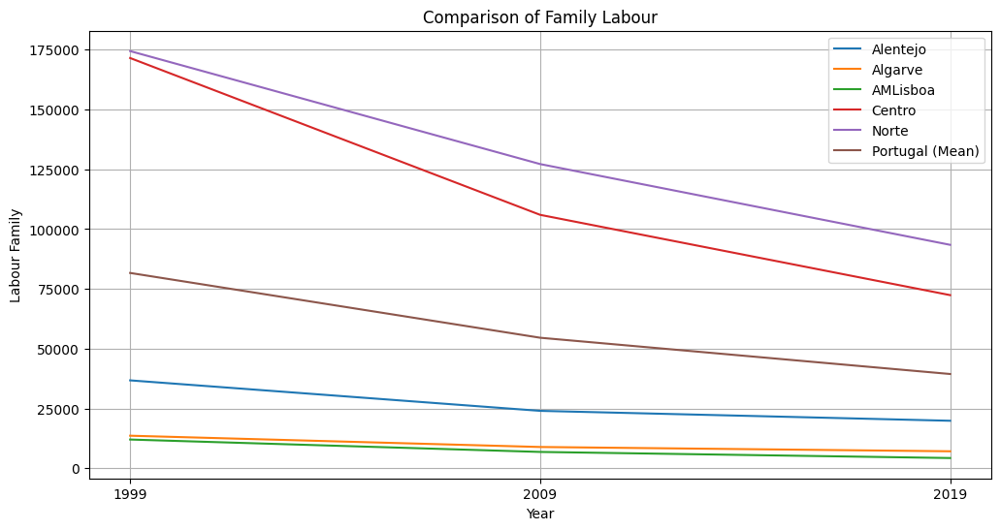

...

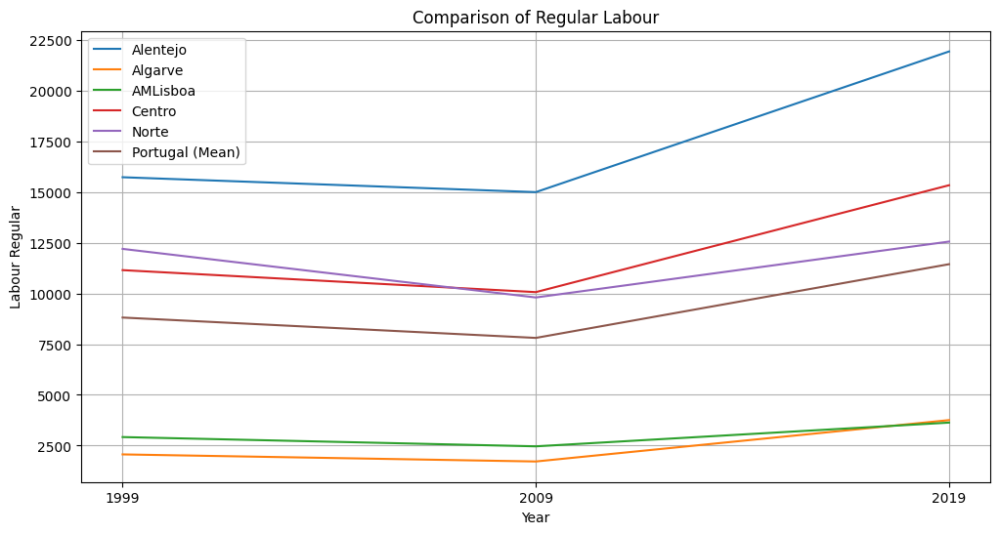

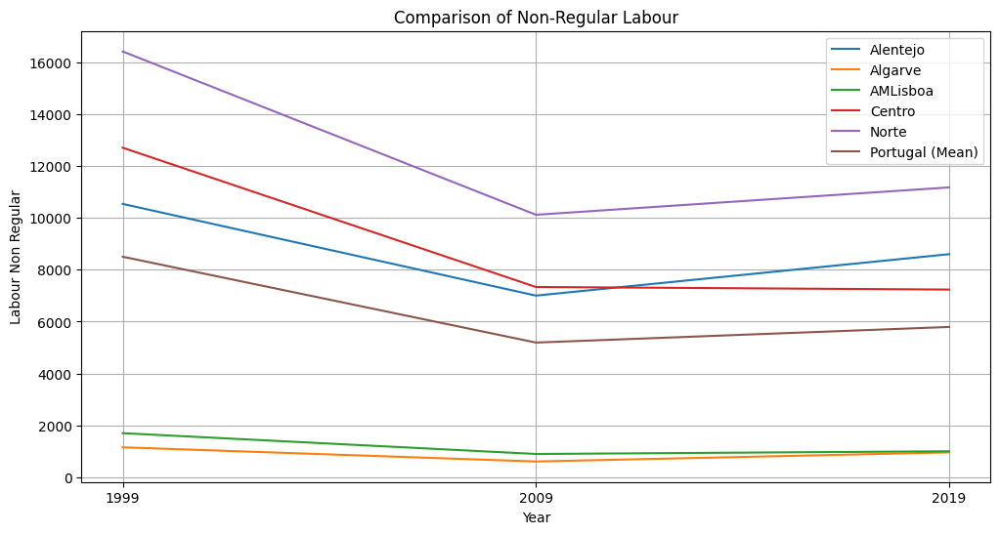

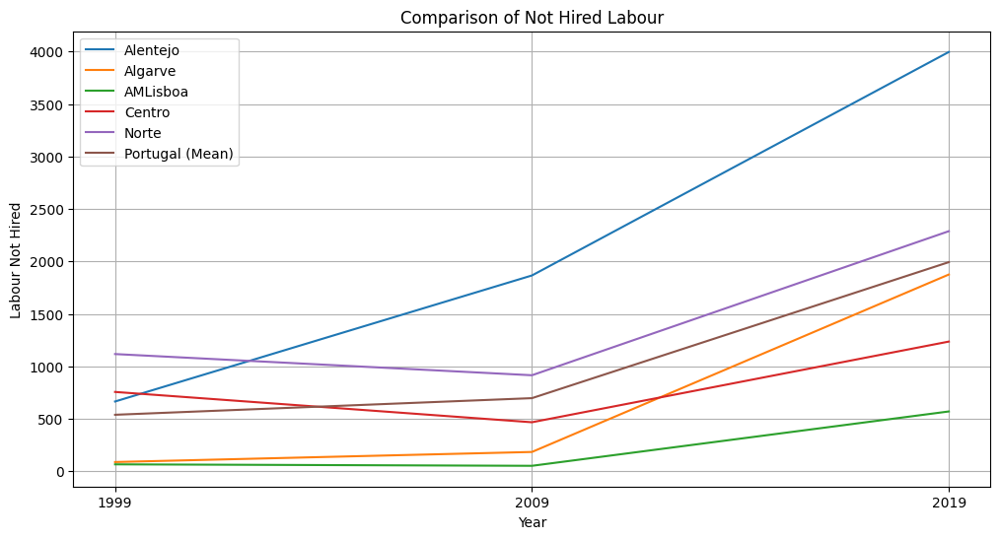

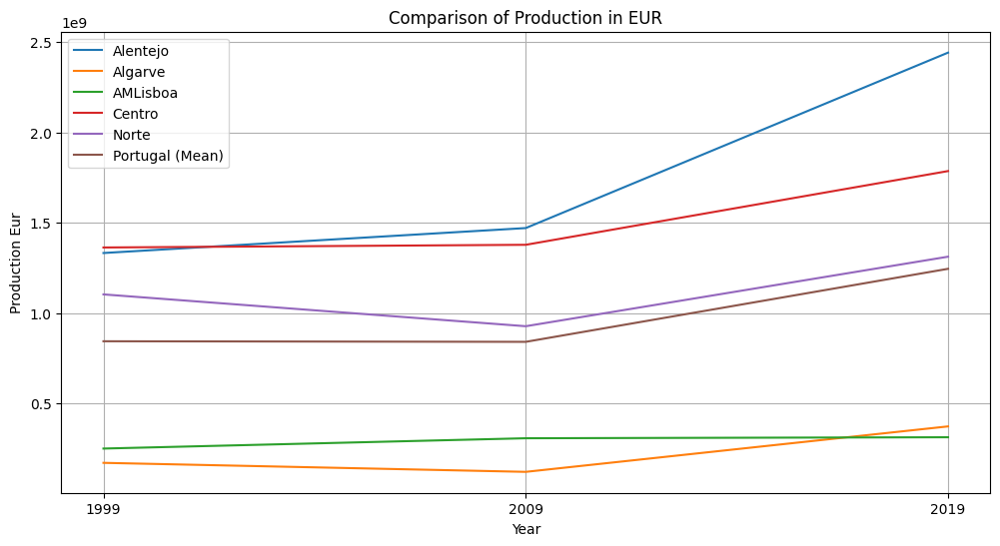

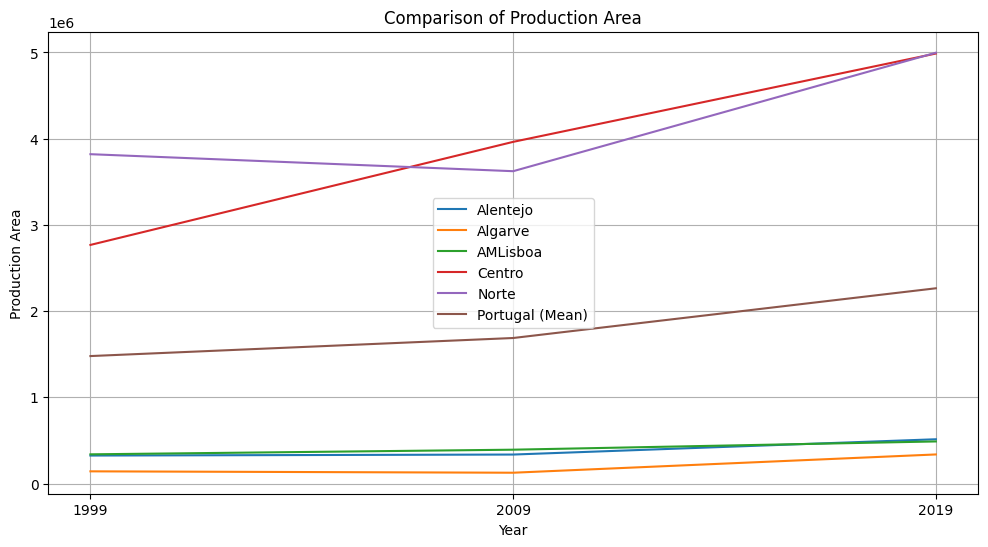

In [13]:


# Load the CSV files into DataFrames
alentejo_df = pd.read_csv('Alentejo_sum.csv')
algarve_df = pd.read_csv('Algarve_sum.csv')
amlisboa_df = pd.read_csv('AMLisboa_sum.csv')
centro_df = pd.read_csv('Centro_sum.csv')
norte_df = pd.read_csv('Norte_sum.csv')

# Calculate the mean for the 'Portugal' DataFrame
portugal_df = (alentejo_df + algarve_df + amlisboa_df + centro_df + norte_df) / 5

# Function to calculate descriptive statistics
def descriptive_statistics(df, region_name):
    stats = df.describe()
    stats['region'] = region_name
    return stats

# Calculate descriptive statistics for each region
stats_alentejo = descriptive_statistics(alentejo_df, 'Alentejo')
stats_algarve = descriptive_statistics(algarve_df, 'Algarve')
stats_amlisboa = descriptive_statistics(amlisboa_df, 'AMLisboa')
stats_centro = descriptive_statistics(centro_df, 'Centro')
stats_norte = descriptive_statistics(norte_df, 'Norte')
stats_portugal = descriptive_statistics(portugal_df, 'Portugal')

# Combine the statistics into a single DataFrame
combined_stats = pd.concat([stats_alentejo, stats_algarve, stats_amlisboa, stats_centro, stats_norte, stats_portugal])

# Function to plot comparison with only the years present in the data
def plot_comparison(df1, df2, df3, df4, df5, df6, column, title):
    plt.figure(figsize=(12, 6))
    years = df1['year'].unique()
    plt.plot(df1['year'], df1[column], label='Alentejo')
    plt.plot(df2['year'], df2[column], label='Algarve')
    plt.plot(df3['year'], df3[column], label='AMLisboa')
    plt.plot(df4['year'], df4[column], label='Centro')
    plt.plot(df5['year'], df5[column], label='Norte')
    plt.plot(df6['year'], df6[column], label='Portugal (Mean)')
    plt.xticks(years)
    plt.xlabel('Year')
    plt.ylabel(column.replace('_', ' ').title())
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot comparisons
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'edu_none', 'Comparison of Education Level: None')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'edu_basic', 'Comparison of Education Level: Basic')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'edu_secondary', 'Comparison of Education Level: Secondary')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'edu_superior', 'Comparison of Education Level: Superior')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_family', 'Comparison of Family Labour')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_holder', 'Comparison of Labour Holder')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_spouse', 'Comparison of Labour Spouse')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_other_family', 'Comparison of Other Family Labour')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_non_family', 'Comparison of Non-Family Labour')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_regular', 'Comparison of Regular Labour')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_non_regular', 'Comparison of Non-Regular Labour')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'labour_not_hired', 'Comparison of Not Hired Labour')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'production_eur', 'Comparison of Production in EUR')
plot_comparison(alentejo_df, algarve_df, amlisboa_df, centro_df, norte_df, portugal_df, 'production_area', 'Comparison of Production Area')




## Correlações

### Matrizes

#### Alentejo


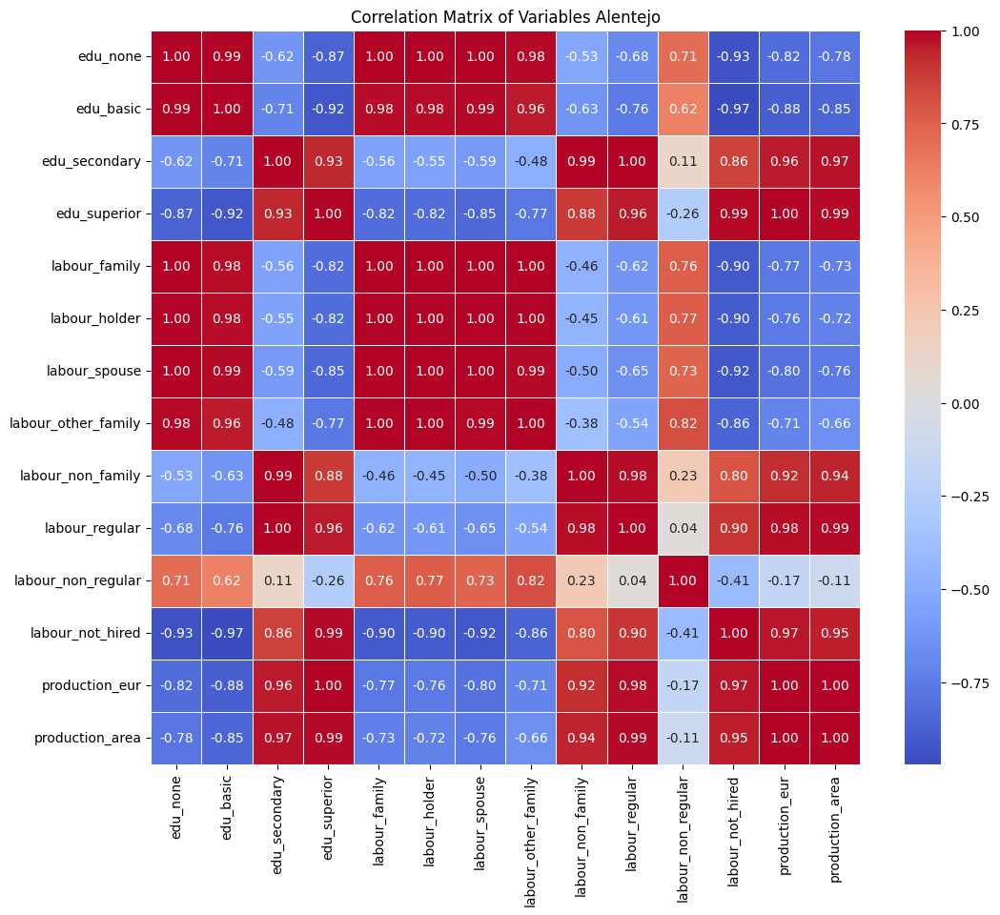

,edu_none,edu_basic,edu_secondary,edu_superior,labour_family,labour_holder,labour_spouse,labour_other_family,labour_non_family,labour_regular,labour_non_regular,labour_not_hired,production_eur,production_area
edu_none,1.000000,0.992826,-0.622924,-0.865800,0.996645,0.995912,0.999319,0.984798,-0.530870,-0.679140,0.705517,-0.934570,-0.817811,-0.782057
edu_basic,0.992826,1.000000,-0.711994,-0.919421,0.979709,0.977967,0.987738,0.956963,-0.628394,-0.762035,0.615716,-0.970407,-0.880756,-0.850965
edu_secondary,-0.622924,-0.711994,1.000000,0.930774,-0.556810,-0.549717,-0.593636,-0.477569,0.993640,0.997255,0.114915,0.860485,0.959627,0.974686
edu_superior,-0.865800,-0.919421,0.930774,1.000000,-0.821942,-0.817063,-0.846748,-0.765719,0.883685,0.955290,-0.256214,0.987179,0.996029,0.988952
labour_family,0.996645,0.979709,-0.556810,-0.821942,1.000000,0.999964,0.998986,0.995711,-0.459732,-0.616789,0.761151,-0.902318,-0.767969,-0.728429
labour_holder,0.995912,0.977967,-0.549717,-0.817063,0.999964,1.000000,0.998567,0.996462,-0.452154,-0.610064,0.766646,-0.898614,-0.762487,-0.722569
labour_spouse,0.999319,0.987738,-0.593636,-0.846748,0.998986,0.998567,1.000000,0.990536,-0.499241,-0.651596,0.731185,-0.920807,-0.796021,-0.758531
labour_other_family,0.984798,0.956963,-0.477569,-0.765719,0.995711,0.996462,0.990536,1.000000,-0.375595,-0.541316,0.817894,-0.858563,-0.705415,-0.661916
labour_non_family,-0.530870,-0.628394,0.993640,0.883685,-0.459732,-0.452154,-0.499241,-0.375595,1.000000,0.982573,0.226045,0.797641,0.921850,0.943309
labour_regular,-0.679140,-0.762035,0.997255,0.955290,-0.616789,-0.610064,-0.651596,-0.541316,0.982573,1.000000,0.041041,0.895848,0.977820,0.988565


In [46]:


# Load the dataset
file_path = 'Alentejo_sum.csv'
data = pd.read_csv(file_path)

# Exclude the 'year' column and recompute the correlation matrix
correlation_matrix_excluding_year = data.drop(columns=['year']).corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap for the correlation matrix excluding 'year'
sns.heatmap(correlation_matrix_excluding_year, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)

# Title and display
plt.title('Correlation Matrix of Variables Alentejo')
plt.show()

# Display the correlation matrix as a dataframe
correlation_matrix_excluding_year



#### Algarve

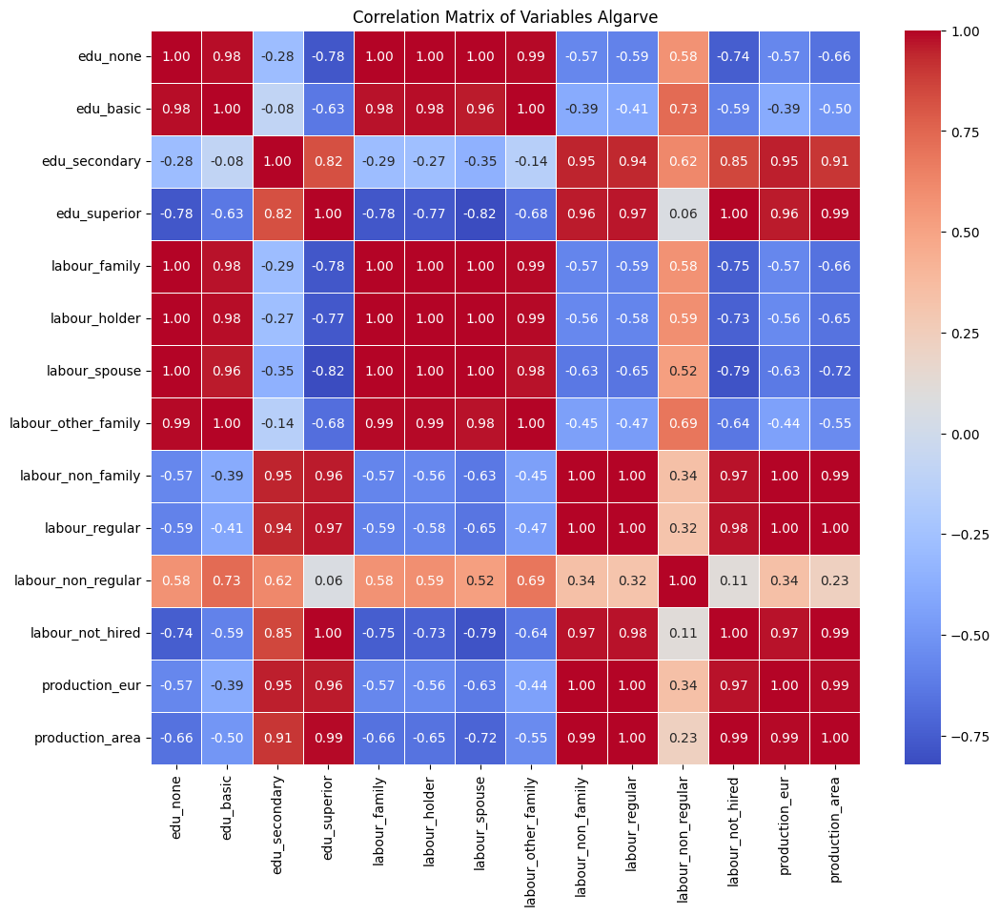

,edu_none,edu_basic,edu_secondary,edu_superior,labour_family,labour_holder,labour_spouse,labour_other_family,labour_non_family,labour_regular,labour_non_regular,labour_not_hired,production_eur,production_area
edu_none,1.000000,0.978921,-0.283497,-0.777050,0.999999,0.999896,0.997315,0.989588,-0.570797,-0.590093,0.578459,-0.744354,-0.567478,-0.662062
edu_basic,0.978921,1.000000,-0.081660,-0.632113,0.978587,0.981768,0.961336,0.998124,-0.391065,-0.412763,0.732867,-0.592274,-0.387347,-0.495039
edu_secondary,-0.283497,-0.081660,1.000000,0.823907,-0.285056,-0.269617,-0.352961,-0.142521,0.949224,0.941503,0.618254,0.851410,0.950486,0.906394
edu_superior,-0.777050,-0.632113,0.823907,1.000000,-0.778072,-0.767878,-0.821057,-0.678365,0.960365,0.966700,0.063950,0.998730,0.959232,0.986188
labour_family,0.999999,0.978587,-0.285056,-0.778072,1.000000,0.999871,0.997433,0.989353,-0.572132,-0.591405,0.577132,-0.745439,-0.568816,-0.663280
labour_holder,0.999896,0.981768,-0.269617,-0.767878,0.999871,1.000000,0.996153,0.991564,-0.558879,-0.578371,0.590180,-0.734631,-0.555527,-0.651169
labour_spouse,0.997315,0.961336,-0.352961,-0.821057,0.997433,0.996153,1.000000,0.976391,-0.629393,-0.647629,0.517172,-0.791257,-0.626251,-0.715166
labour_other_family,0.989588,0.998124,-0.142521,-0.678365,0.989353,0.991564,0.976391,1.000000,-0.446675,-0.467750,0.689840,-0.640490,-0.443060,-0.547302
labour_non_family,-0.570797,-0.391065,0.949224,0.960365,-0.572132,-0.558879,-0.629393,-0.446675,1.000000,0.999719,0.339591,0.973188,0.999992,0.993269
labour_regular,-0.590093,-0.412763,0.941503,0.966700,-0.591405,-0.578371,-0.647629,-0.467750,0.999719,1.000000,0.317209,0.978365,0.999615,0.995735


In [44]:
# Load the dataset
file_path = 'Algarve_sum.csv'
data = pd.read_csv(file_path)

# Exclude the 'year' column and recompute the correlation matrix
correlation_matrix_excluding_year = data.drop(columns=['year']).corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap for the correlation matrix excluding 'year'
sns.heatmap(correlation_matrix_excluding_year, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)

# Title and display
plt.title('Correlation Matrix of Variables Algarve')
plt.show()

# Display the correlation matrix as a dataframe
correlation_matrix_excluding_year


#### AMLisboa

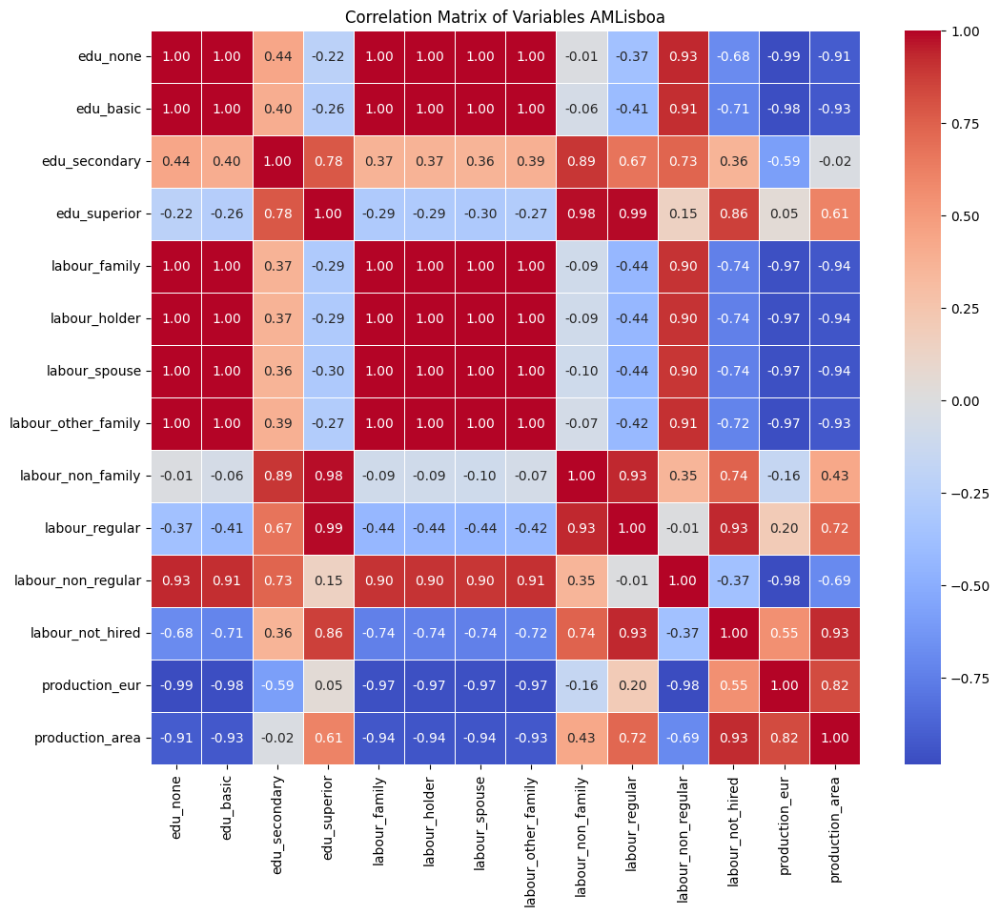

,edu_none,edu_basic,edu_secondary,edu_superior,labour_family,labour_holder,labour_spouse,labour_other_family,labour_non_family,labour_regular,labour_non_regular,labour_not_hired,production_eur,production_area
edu_none,1.000000,0.999086,0.436501,-0.218907,0.997121,0.996987,0.996752,0.998469,-0.014575,-0.370222,0.931200,-0.684169,-0.985019,-0.909012
edu_basic,0.999086,1.000000,0.397647,-0.260413,0.999451,0.999391,0.999283,0.999921,-0.057300,-0.409590,0.914769,-0.714717,-0.976748,-0.925995
edu_secondary,0.436501,0.397647,1.000000,0.782329,0.367018,0.365394,0.362626,0.386066,0.893246,0.674171,0.734419,0.357534,-0.585114,-0.021816
edu_superior,-0.218907,-0.260413,0.782329,1.000000,-0.292269,-0.293938,-0.296777,-0.272545,0.978833,0.987457,0.151821,0.861403,0.047362,0.605650
labour_family,0.997121,0.999451,0.367018,-0.292269,1.000000,0.999998,0.999989,0.999789,-0.090357,-0.439600,0.900878,-0.737505,-0.969105,-0.937999
labour_holder,0.996987,0.999391,0.365394,-0.293938,0.999998,1.000000,0.999996,0.999751,-0.092095,-0.441167,0.900119,-0.738683,-0.968673,-0.938603
labour_spouse,0.996752,0.999283,0.362626,-0.296777,0.999989,0.999996,1.000000,0.999681,-0.095054,-0.443832,0.898820,-0.740683,-0.967931,-0.939624
labour_other_family,0.998469,0.999921,0.386066,-0.272545,0.999789,0.999751,0.999681,1.000000,-0.069862,-0.421040,0.909612,-0.723465,-0.973972,-0.930674
labour_non_family,-0.014575,-0.057300,0.893246,0.978833,-0.090357,-0.092095,-0.095054,-0.069862,1.000000,0.934240,0.350897,0.739217,-0.158073,0.429974
labour_regular,-0.370222,-0.409590,0.674171,0.987457,-0.439600,-0.441167,-0.443832,-0.421040,0.934240,1.000000,-0.006144,0.930795,0.204482,0.723692


In [45]:
# Load the dataset
file_path = 'AMLisboa_sum.csv'
data = pd.read_csv(file_path)

# Exclude the 'year' column and recompute the correlation matrix
correlation_matrix_excluding_year = data.drop(columns=['year']).corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap for the correlation matrix excluding 'year'
sns.heatmap(correlation_matrix_excluding_year, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)

# Title and display
plt.title('Correlation Matrix of Variables AMLisboa')
plt.show()

# Display the correlation matrix as a dataframe
correlation_matrix_excluding_year


#### Centro

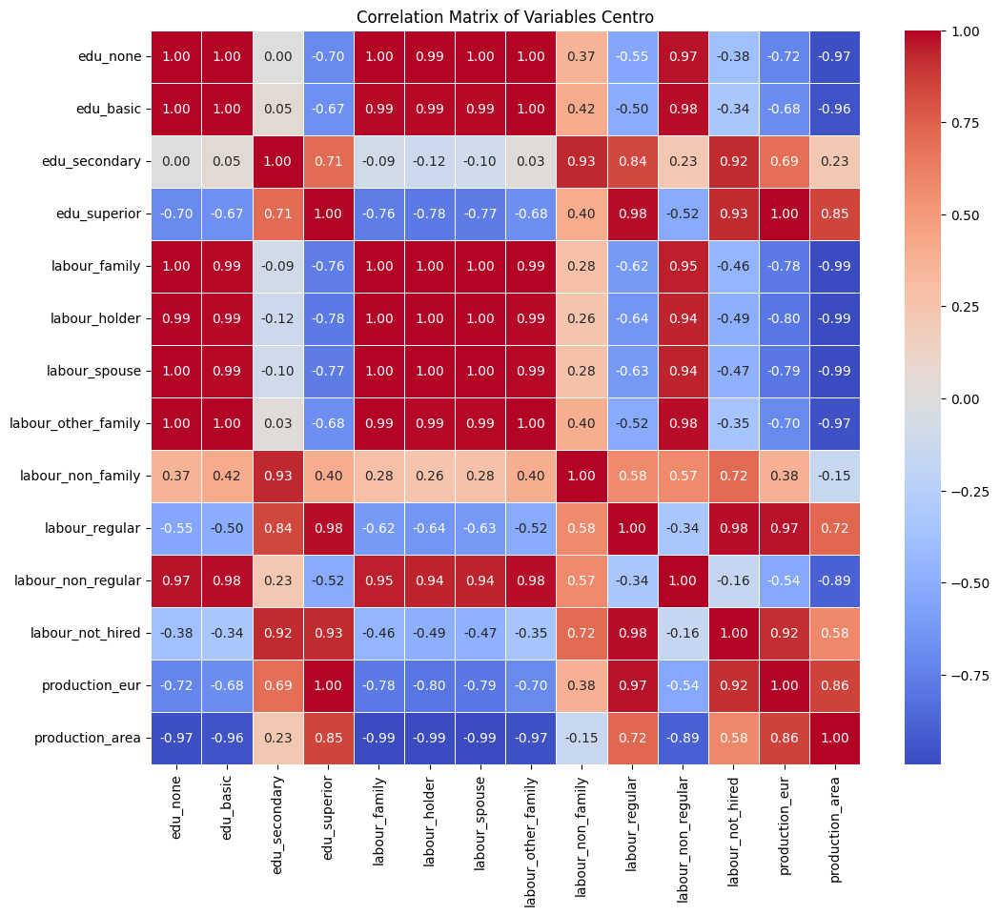

,edu_none,edu_basic,edu_secondary,edu_superior,labour_family,labour_holder,labour_spouse,labour_other_family,labour_non_family,labour_regular,labour_non_regular,labour_not_hired,production_eur,production_area
edu_none,1.000000,0.998689,0.001038,-0.704161,0.996091,0.993185,0.995170,0.999519,0.368136,-0.546777,0.972480,-0.383319,-0.721225,-0.974062
edu_basic,0.998689,1.000000,0.052222,-0.666894,0.990264,0.985917,0.988841,0.999796,0.415244,-0.503205,0.983131,-0.335541,-0.684823,-0.961203
edu_secondary,0.001038,0.052222,1.000000,0.709310,-0.087297,-0.115521,-0.097130,0.032043,0.930154,0.836710,0.233994,0.923218,0.691952,0.225271
edu_superior,-0.704161,-0.666894,0.709310,1.000000,-0.764127,-0.782118,-0.770460,-0.681806,0.400949,0.979521,-0.519354,0.925723,0.999704,0.846565
labour_family,0.996091,0.990264,-0.087297,-0.764127,1.000000,0.999598,0.999951,0.992873,0.284569,-0.618598,0.948099,-0.463404,-0.779593,-0.990242
labour_holder,0.993185,0.985917,-0.115521,-0.782118,0.999598,1.000000,0.999829,0.989093,0.257260,-0.640637,0.938698,-0.488355,-0.797045,-0.993797
labour_spouse,0.995170,0.988841,-0.097130,-0.770460,0.999951,0.999829,1.000000,0.991648,0.275089,-0.626327,0.944913,-0.472133,-0.785739,-0.991570
labour_other_family,0.999519,0.999796,0.032043,-0.681806,0.992873,0.989093,0.991648,1.000000,0.396788,-0.520554,0.979237,-0.354497,-0.699400,-0.966577
labour_non_family,0.368136,0.415244,0.930154,0.400949,0.284569,0.257260,0.275089,0.396788,1.000000,0.577189,0.574628,0.717639,0.378545,-0.148197
labour_regular,-0.546777,-0.503205,0.836710,0.979521,-0.618598,-0.640637,-0.626327,-0.520554,0.577189,1.000000,-0.336657,0.982913,0.974333,0.722056


In [47]:
# Load the dataset
file_path = 'Centro_sum.csv'
data = pd.read_csv(file_path)

# Exclude the 'year' column and recompute the correlation matrix
correlation_matrix_excluding_year = data.drop(columns=['year']).corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap for the correlation matrix excluding 'year'
sns.heatmap(correlation_matrix_excluding_year, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)

# Title and display
plt.title('Correlation Matrix of Variables Centro')
plt.show()

# Display the correlation matrix as a dataframe
correlation_matrix_excluding_year


#### Norte

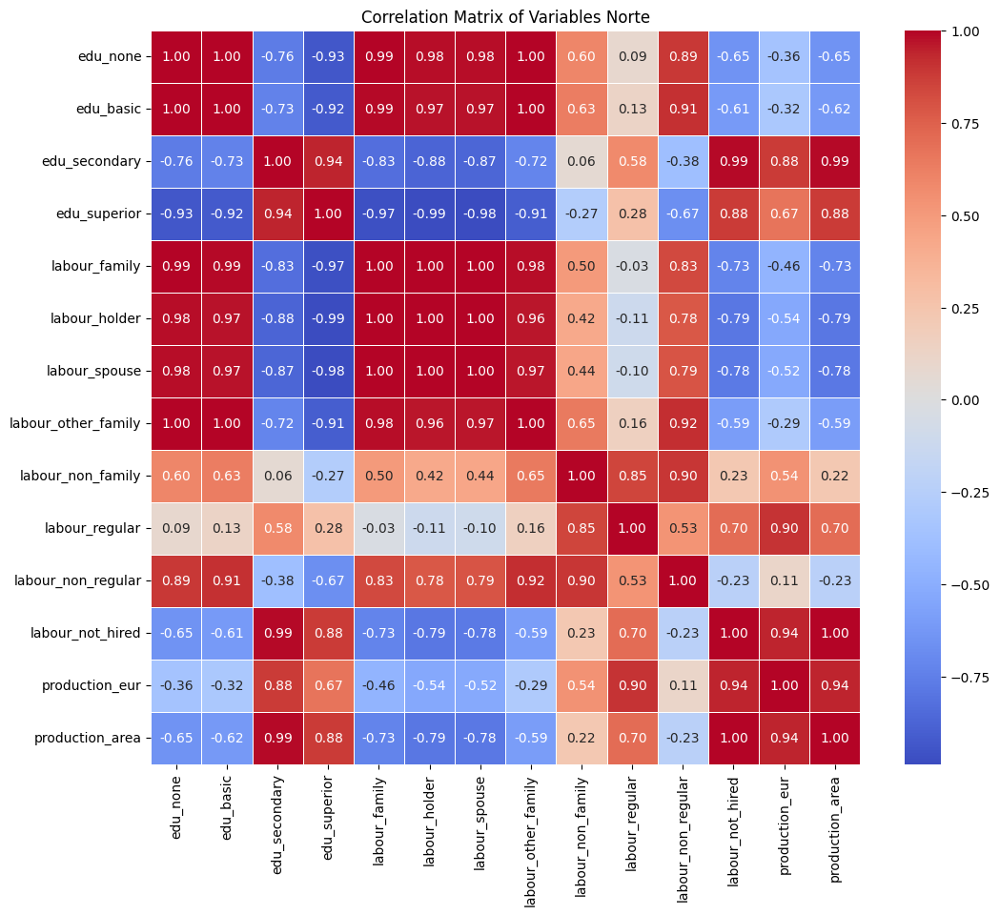

,edu_none,edu_basic,edu_secondary,edu_superior,labour_family,labour_holder,labour_spouse,labour_other_family,labour_non_family,labour_regular,labour_non_regular,labour_not_hired,production_eur,production_area
edu_none,1.000000,0.999083,-0.763238,-0.933928,0.993755,0.980083,0.982893,0.997496,0.595173,0.086636,0.890115,-0.646462,-0.356803,-0.649129
edu_basic,0.999083,1.000000,-0.734882,-0.917772,0.988068,0.970684,0.974109,0.999609,0.629025,0.129200,0.908807,-0.613212,-0.316489,-0.615974
edu_secondary,-0.763238,-0.734882,1.000000,0.943771,-0.830566,-0.876349,-0.869181,-0.715630,0.064960,0.577565,-0.384910,0.986357,0.875915,0.986928
edu_superior,-0.933928,-0.917772,0.943771,1.000000,-0.967982,-0.986315,-0.983788,-0.906308,-0.268595,0.275205,-0.668396,0.876472,0.667160,0.878152
labour_family,0.993755,0.988068,-0.830566,-0.967982,1.000000,0.996121,0.997306,0.983375,0.501790,-0.025067,0.833705,-0.727555,-0.458811,-0.729953
labour_holder,0.980083,0.970684,-0.876349,-0.986315,0.996121,1.000000,0.999892,0.963583,0.423732,-0.112934,0.781881,-0.785100,-0.535216,-0.787264
labour_spouse,0.982893,0.974109,-0.869181,-0.983788,0.997306,0.999892,1.000000,0.967406,0.436988,-0.098330,0.790952,-0.775919,-0.522752,-0.778123
labour_other_family,0.997496,0.999609,-0.715630,-0.906308,0.983375,0.963583,0.967406,1.000000,0.650517,0.156878,0.920118,-0.590884,-0.289839,-0.593705
labour_non_family,0.595173,0.629025,0.064960,-0.268595,0.501790,0.423732,0.436988,0.650517,1.000000,0.852139,0.896001,0.228345,0.538345,0.224935
labour_regular,0.086636,0.129200,0.577565,0.275205,-0.025067,-0.112934,-0.098330,0.156878,0.852139,1.000000,0.531139,0.704071,0.899755,0.701580


In [48]:
# Load the dataset
file_path = 'Norte_sum.csv'
data = pd.read_csv(file_path)

# Exclude the 'year' column and recompute the correlation matrix
correlation_matrix_excluding_year = data.drop(columns=['year']).corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap for the correlation matrix excluding 'year'
sns.heatmap(correlation_matrix_excluding_year, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)

# Title and display
plt.title('Correlation Matrix of Variables Norte')
plt.show()

# Display the correlation matrix as a dataframe
correlation_matrix_excluding_year

#### Portugal

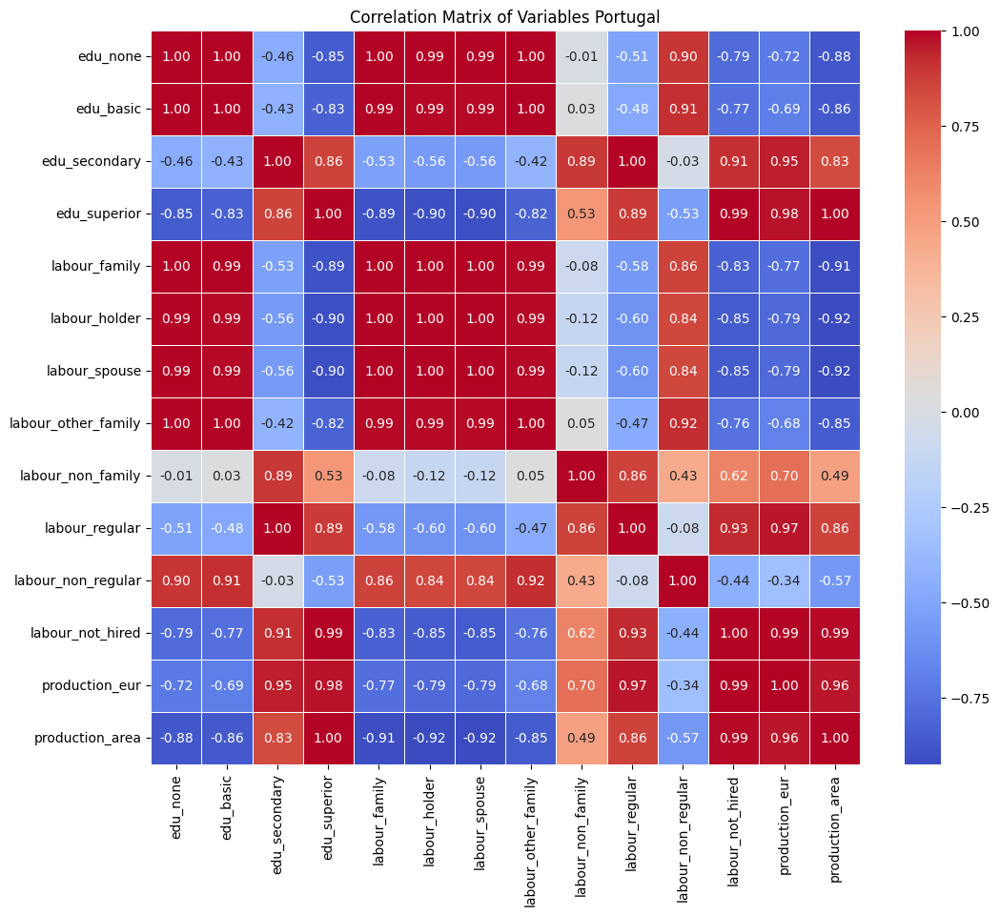

,edu_none,edu_basic,edu_secondary,edu_superior,labour_family,labour_holder,labour_spouse,labour_other_family,labour_non_family,labour_regular,labour_non_regular,labour_not_hired,production_eur,production_area
edu_none,1.000000,0.999367,-0.464090,-0.852345,0.997008,0.993869,0.994002,0.998657,-0.006648,-0.512044,0.897736,-0.788088,-0.718348,-0.876467
edu_basic,0.999367,1.000000,-0.432277,-0.833196,0.993626,0.989305,0.989481,0.999868,0.028939,-0.481156,0.912843,-0.765686,-0.693138,-0.858780
edu_secondary,-0.464090,-0.432277,1.000000,0.858814,-0.531170,-0.559181,-0.558180,-0.417578,0.888854,0.998490,-0.026410,0.911001,0.949607,0.833233
edu_superior,-0.852345,-0.833196,0.858814,1.000000,-0.890220,-0.904942,-0.904428,-0.824107,0.528635,0.885657,-0.534790,0.993650,0.976109,0.998847
labour_family,0.997008,0.993626,-0.531170,-0.890220,1.000000,0.999442,0.999481,0.991665,-0.083924,-0.576908,0.860998,-0.833312,-0.769973,-0.911060
labour_holder,0.993869,0.989305,-0.559181,-0.904942,0.999442,1.000000,0.999999,0.986807,-0.117169,-0.603875,0.843525,-0.851316,-0.790861,-0.924326
labour_spouse,0.994002,0.989481,-0.558180,-0.904428,0.999481,0.999999,1.000000,0.987001,-0.115970,-0.602913,0.844172,-0.850682,-0.790122,-0.923864
labour_other_family,0.998657,0.999868,-0.417578,-0.824107,0.991665,0.986807,0.987001,1.000000,0.045165,-0.466858,0.919352,-0.755140,-0.681343,-0.850347
labour_non_family,-0.006648,0.028939,0.888854,0.528635,-0.083924,-0.117169,-0.115970,0.045165,1.000000,0.862344,0.434556,0.620788,0.700445,0.487279
labour_regular,-0.512044,-0.481156,0.998490,0.885657,-0.576908,-0.603875,-0.602913,-0.466858,0.862344,1.000000,-0.081280,0.932279,0.965390,0.862346


In [52]:
# Load the dataset
file_path = 'Portugal_sum.csv'
data = pd.read_csv(file_path)

# Exclude the 'year' column and recompute the correlation matrix
correlation_matrix_excluding_year = data.drop(columns=['year']).corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap for the correlation matrix excluding 'year'
sns.heatmap(correlation_matrix_excluding_year, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)

# Title and display
plt.title('Correlation Matrix of Variables Portugal')
plt.show()

# Display the correlation matrix as a dataframe
correlation_matrix_excluding_year


### Diferença na Matrix de Correlação

##### Norte

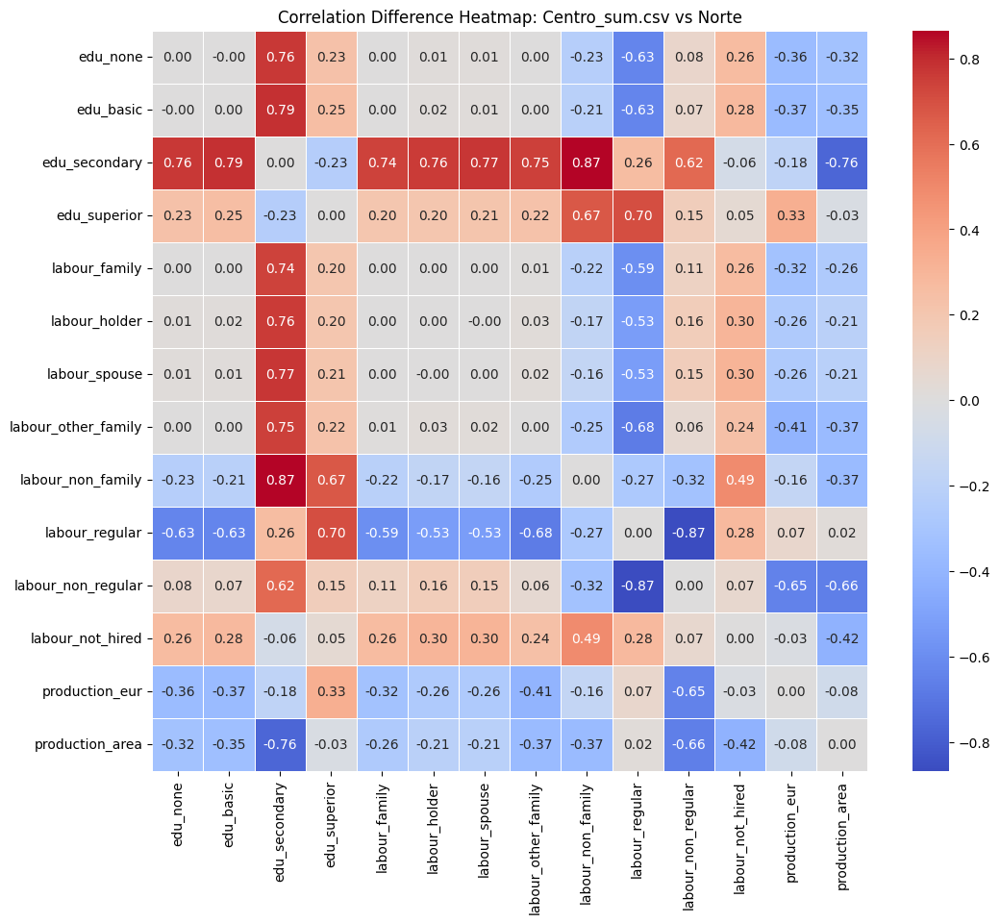

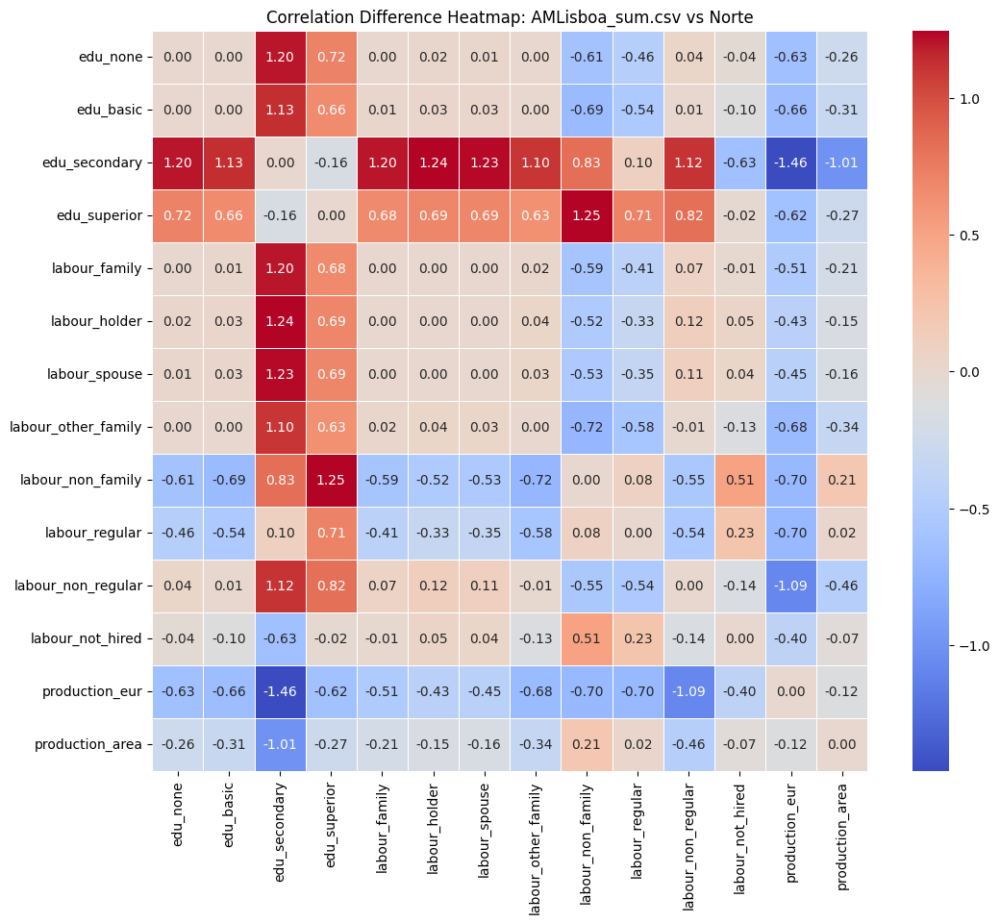

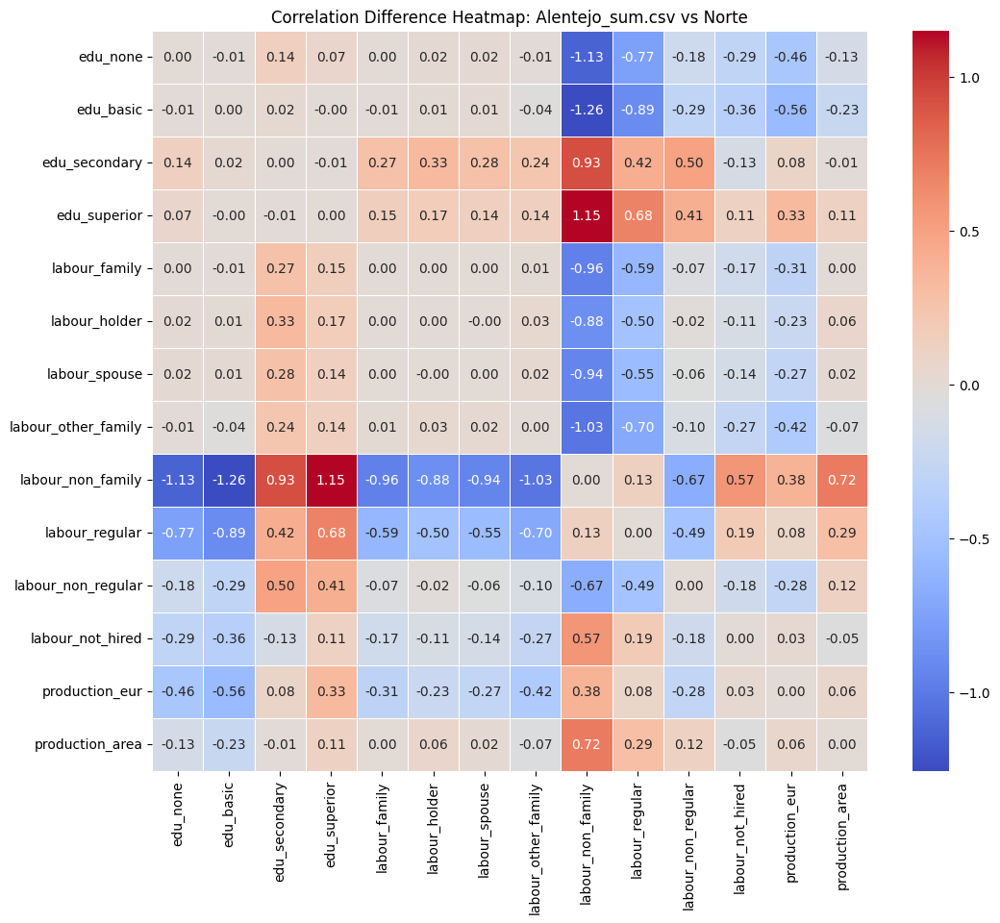

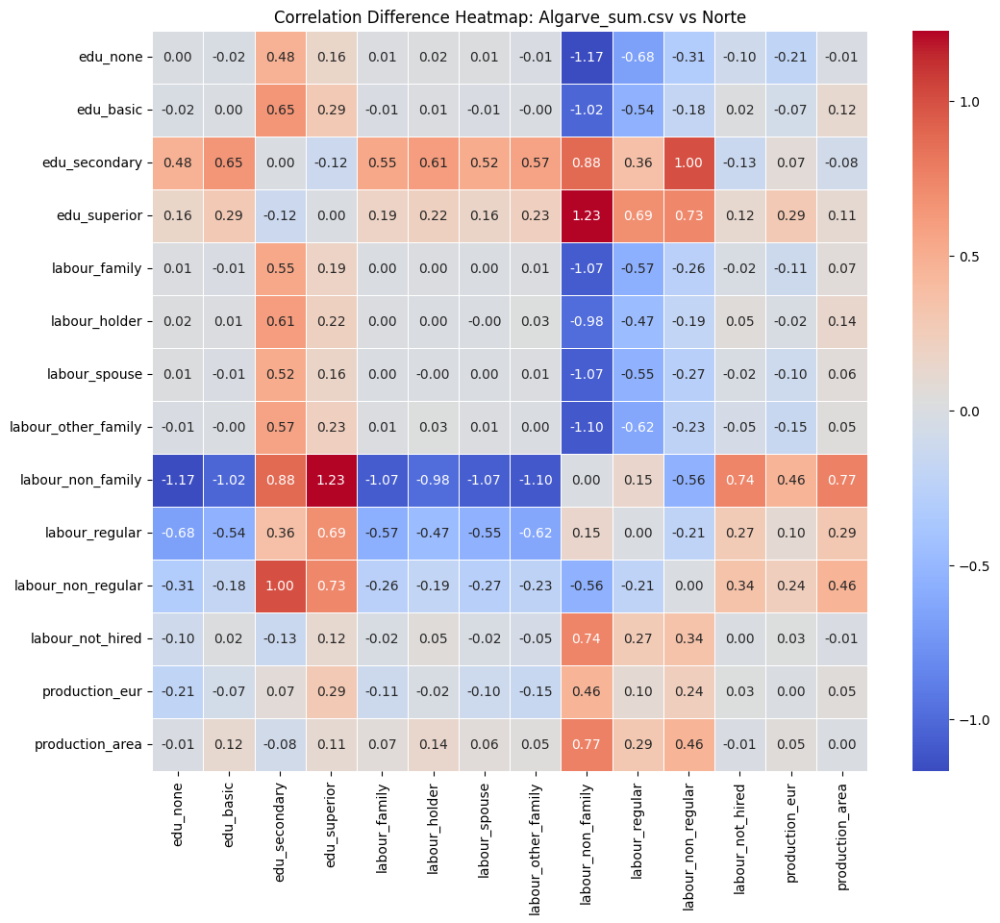

In [49]:


# Load the datasets
files = ['Norte_sum.csv', 'Centro_sum.csv', 'AMLisboa_sum.csv', 'Alentejo_sum.csv', 'Algarve_sum.csv']
dataframes = {file: pd.read_csv(file) for file in files}

# Compute the correlation matrices excluding 'year' column
correlation_matrices = {file: df.drop(columns=['year']).corr() for file, df in dataframes.items()}

# Calculate the difference in correlation matrices (taking Norte as the reference)
reference_region = 'Norte_sum.csv'
difference_matrices = {file: correlation_matrices[file] - correlation_matrices[reference_region] for file in files if file != reference_region}

# Plot the correlation difference heatmap for each region compared to Norte
for file, diff_matrix in difference_matrices.items():
    plt.figure(figsize=(12, 10))
    sns.heatmap(diff_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
    plt.title(f'Correlation Difference Heatmap: {file} vs Norte')
    plt.show()


##### Centro

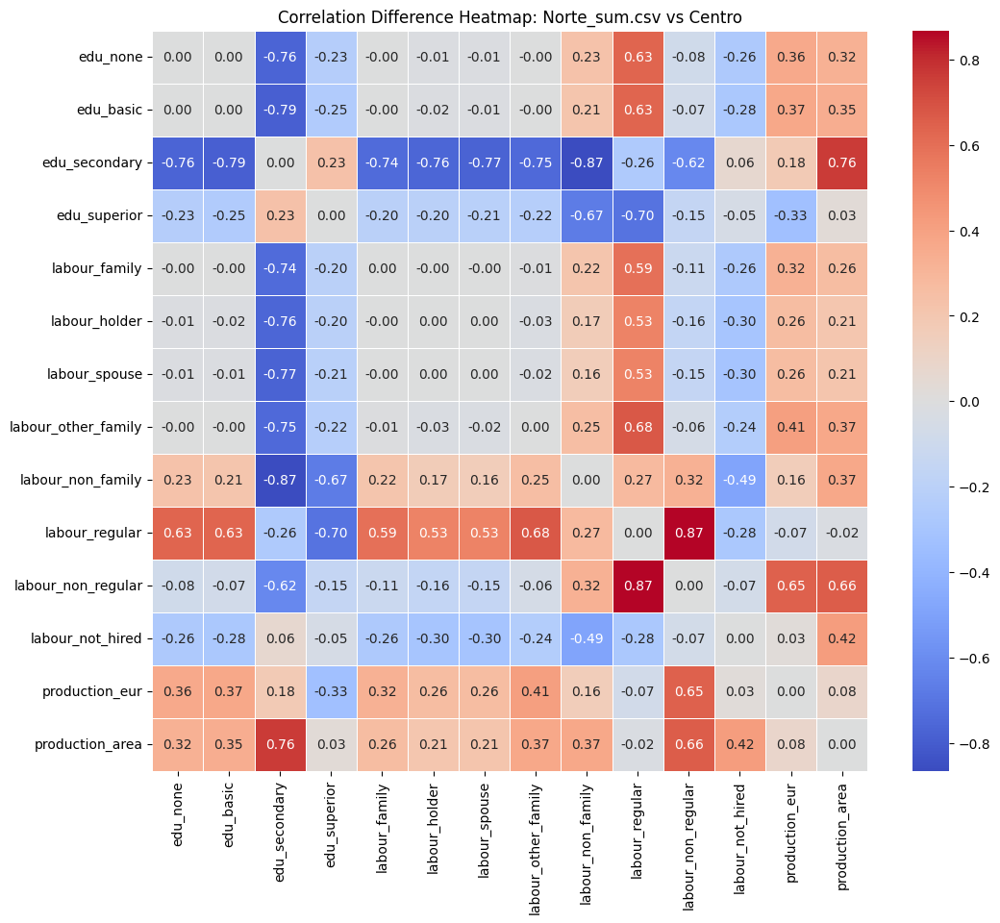

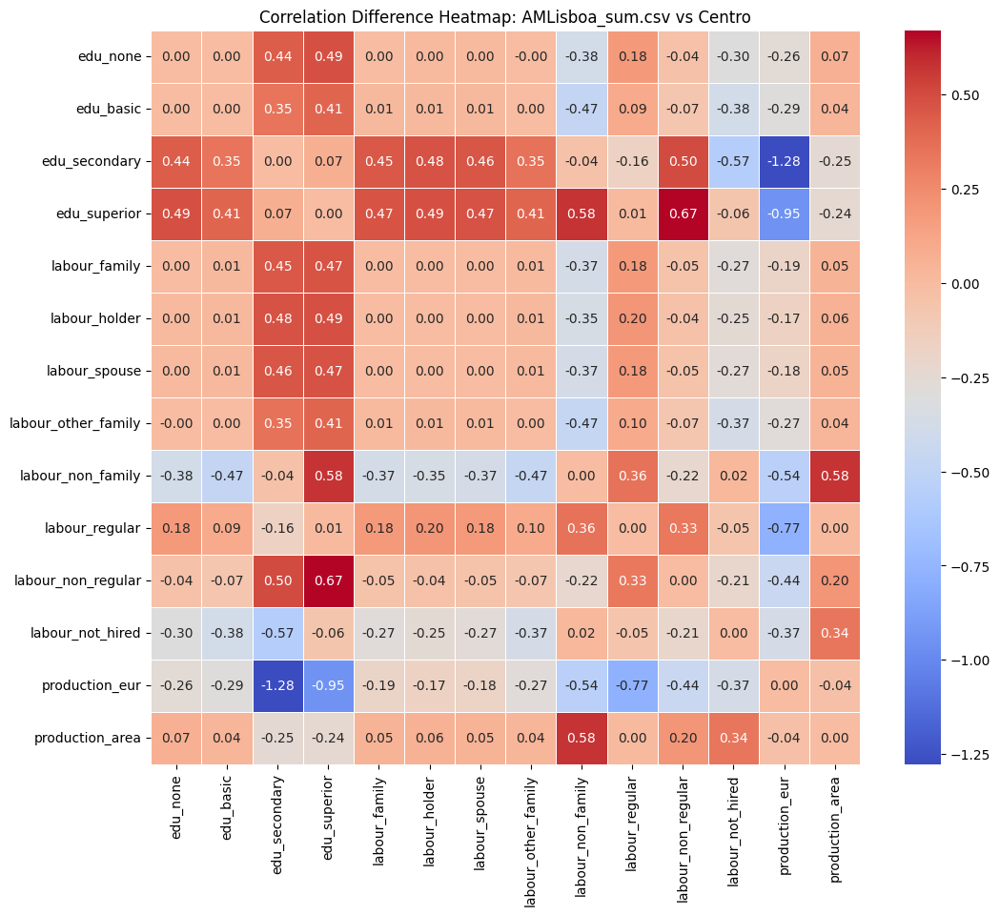

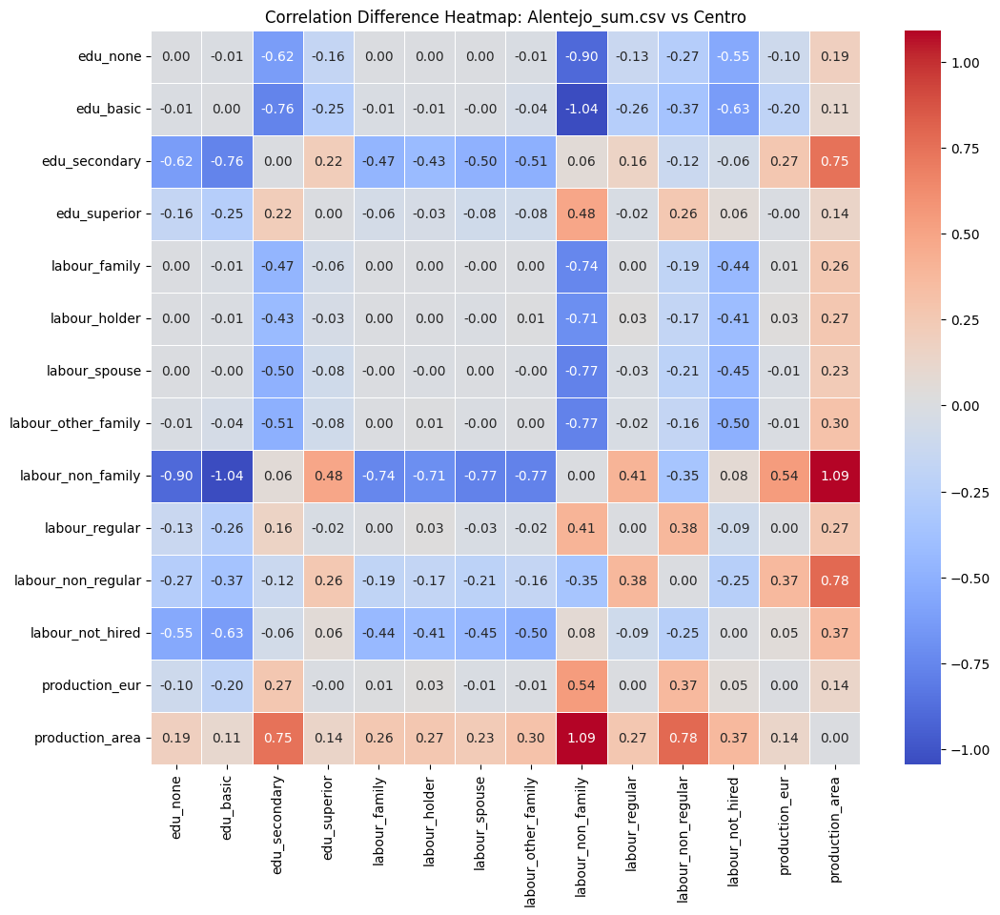

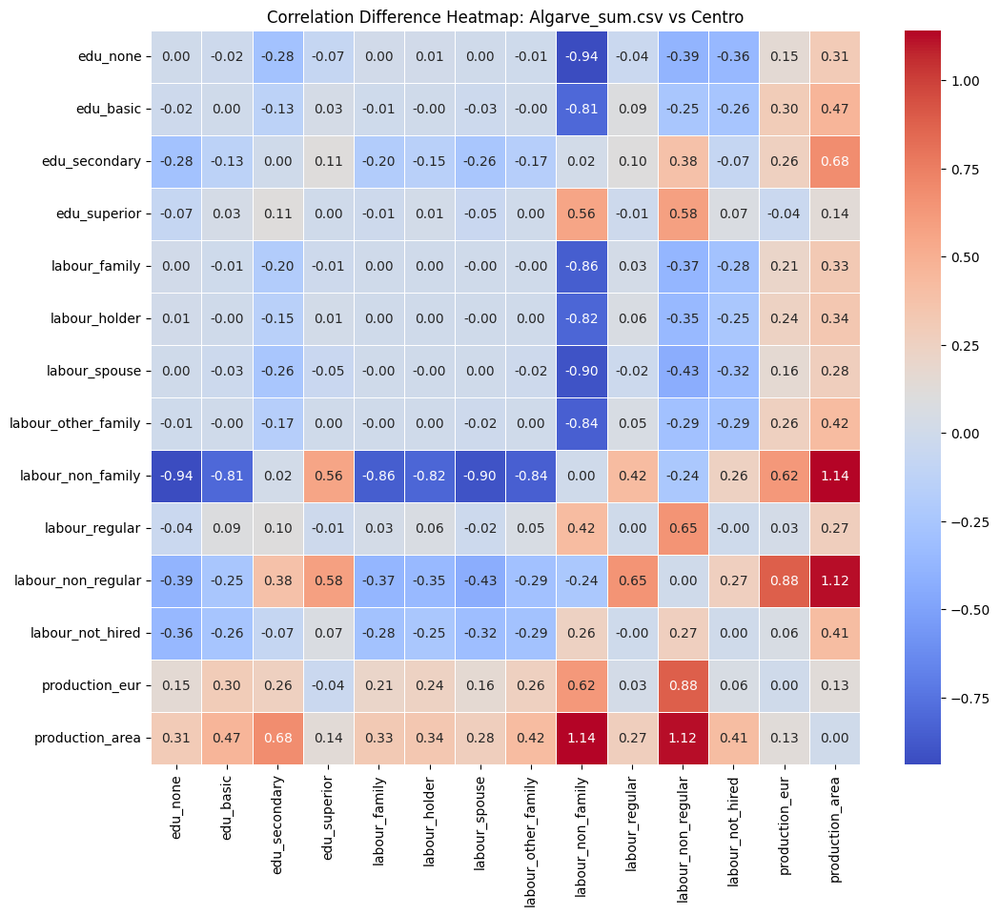

In [58]:
# Load the datasets
files = ['Norte_sum.csv', 'Centro_sum.csv', 'AMLisboa_sum.csv', 'Alentejo_sum.csv', 'Algarve_sum.csv']
dataframes = {file: pd.read_csv(file) for file in files}

# Compute the correlation matrices excluding 'year' column
correlation_matrices = {file: df.drop(columns=['year']).corr() for file, df in dataframes.items()}

# Calculate the difference in correlation matrices (taking Norte as the reference)
reference_region = 'Centro_sum.csv'
difference_matrices = {file: correlation_matrices[file] - correlation_matrices[reference_region] for file in files if file != reference_region}

# Plot the correlation difference heatmap for each region compared to Norte
for file, diff_matrix in difference_matrices.items():
    plt.figure(figsize=(12, 10))
    sns.heatmap(diff_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
    plt.title(f'Correlation Difference Heatmap: {file} vs Centro')
    plt.show()

##### AMLisboa

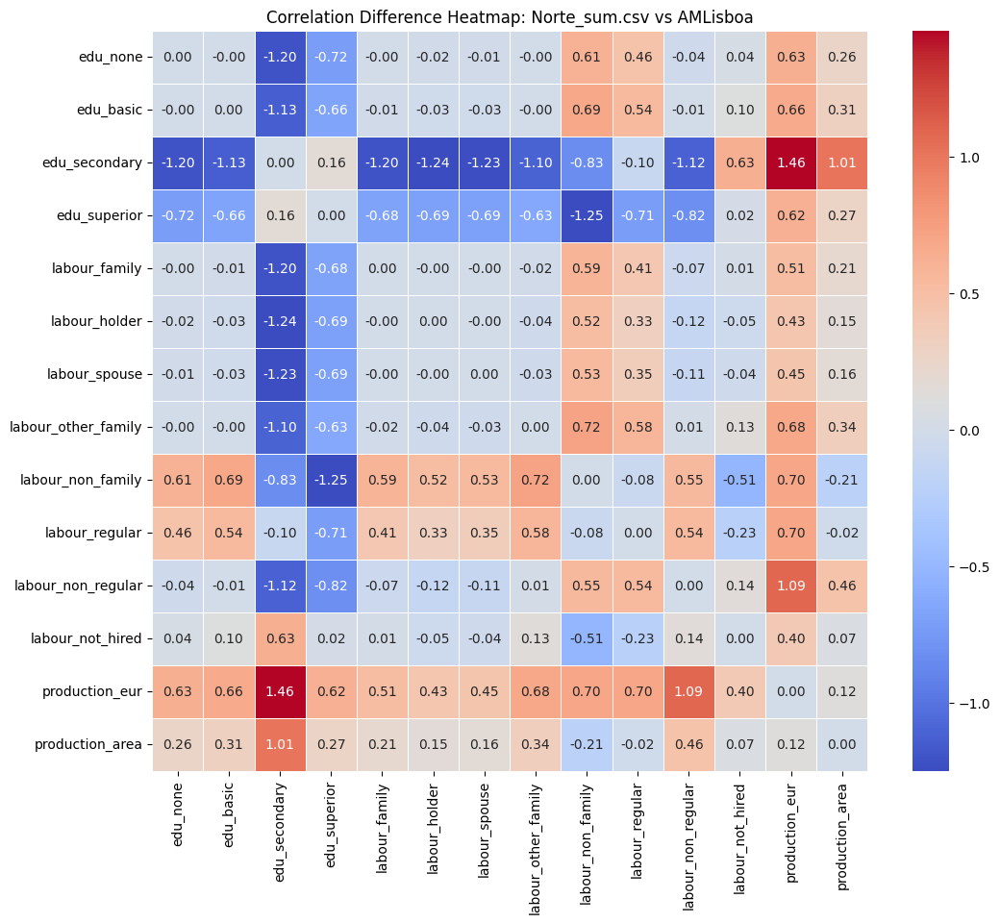

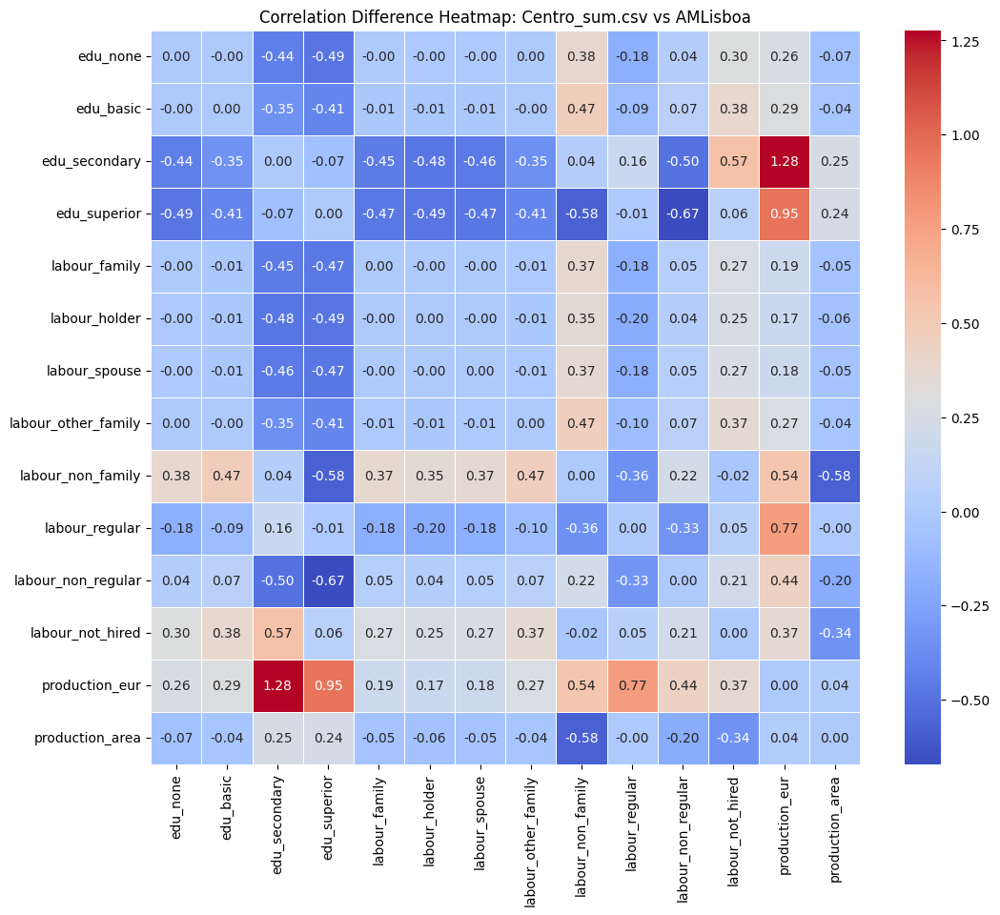

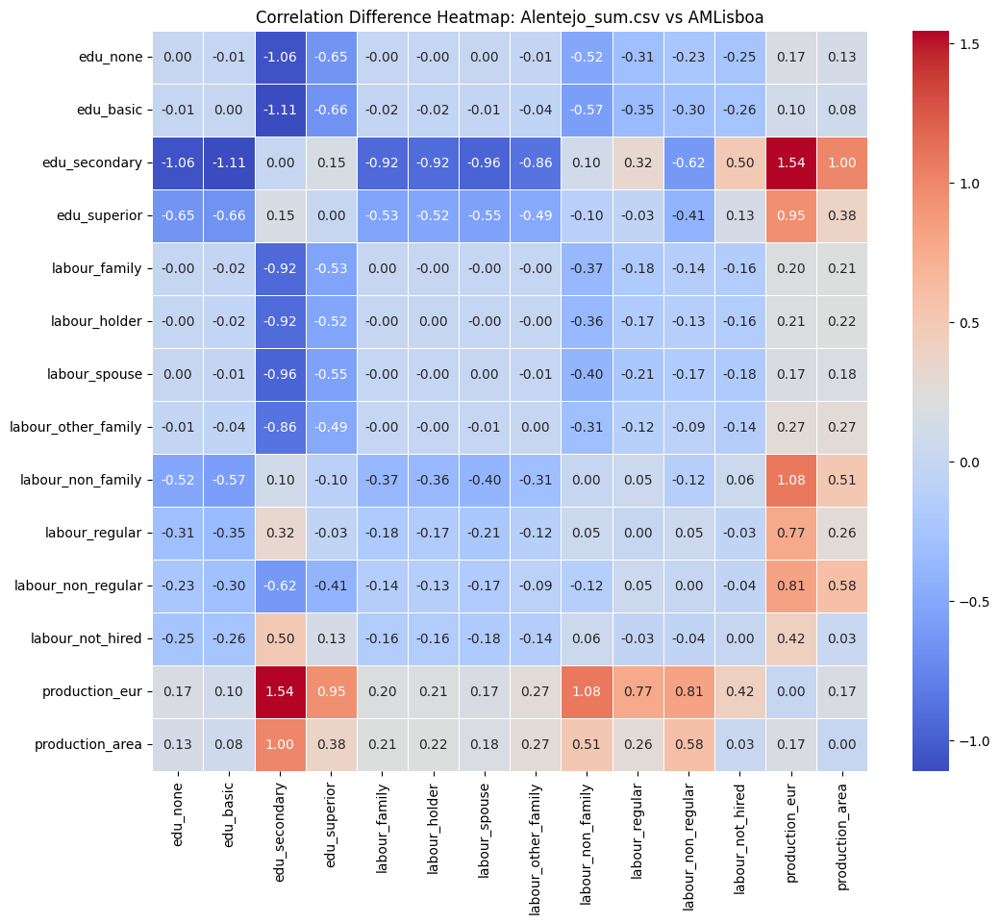

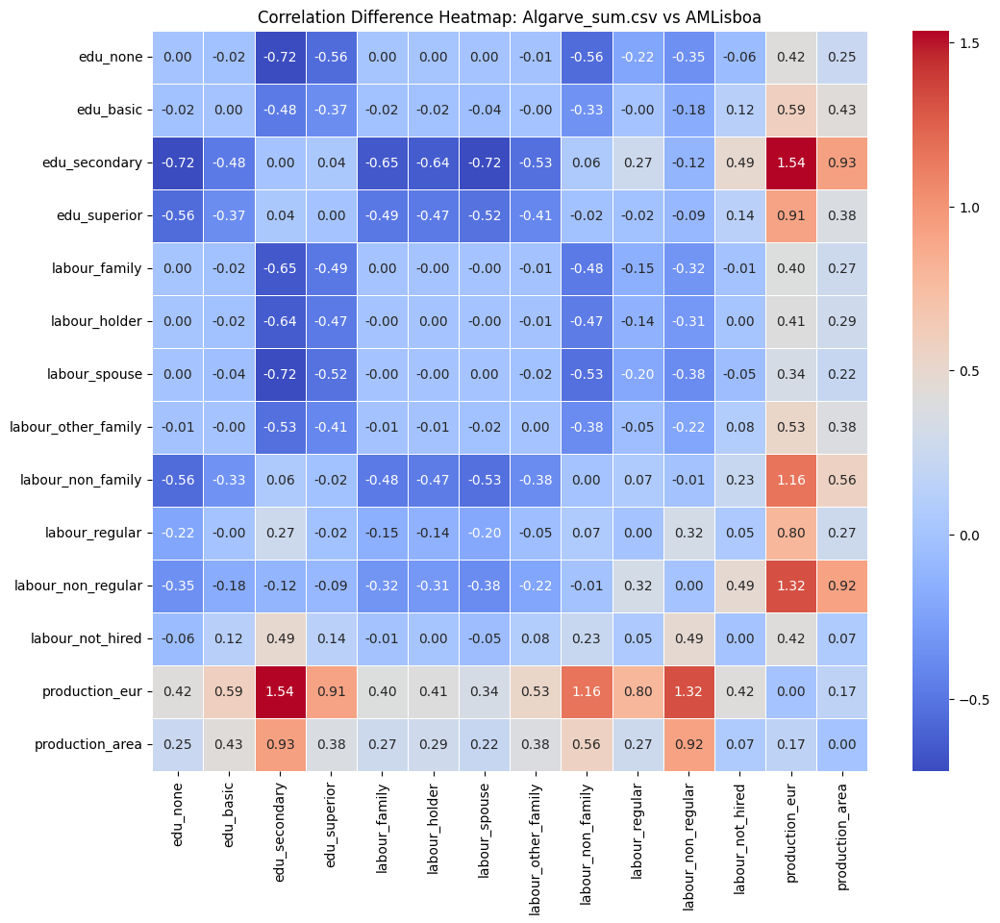

In [60]:
# Load the datasets
files = ['Norte_sum.csv', 'Centro_sum.csv', 'AMLisboa_sum.csv', 'Alentejo_sum.csv', 'Algarve_sum.csv']
dataframes = {file: pd.read_csv(file) for file in files}

# Compute the correlation matrices excluding 'year' column
correlation_matrices = {file: df.drop(columns=['year']).corr() for file, df in dataframes.items()}

# Calculate the difference in correlation matrices (taking Norte as the reference)
reference_region = 'AMLisboa_sum.csv'
difference_matrices = {file: correlation_matrices[file] - correlation_matrices[reference_region] for file in files if file != reference_region}

# Plot the correlation difference heatmap for each region compared to Norte
for file, diff_matrix in difference_matrices.items():
    plt.figure(figsize=(12, 10))
    sns.heatmap(diff_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
    plt.title(f'Correlation Difference Heatmap: {file} vs AMLisboa')
    plt.show()

##### Algarve

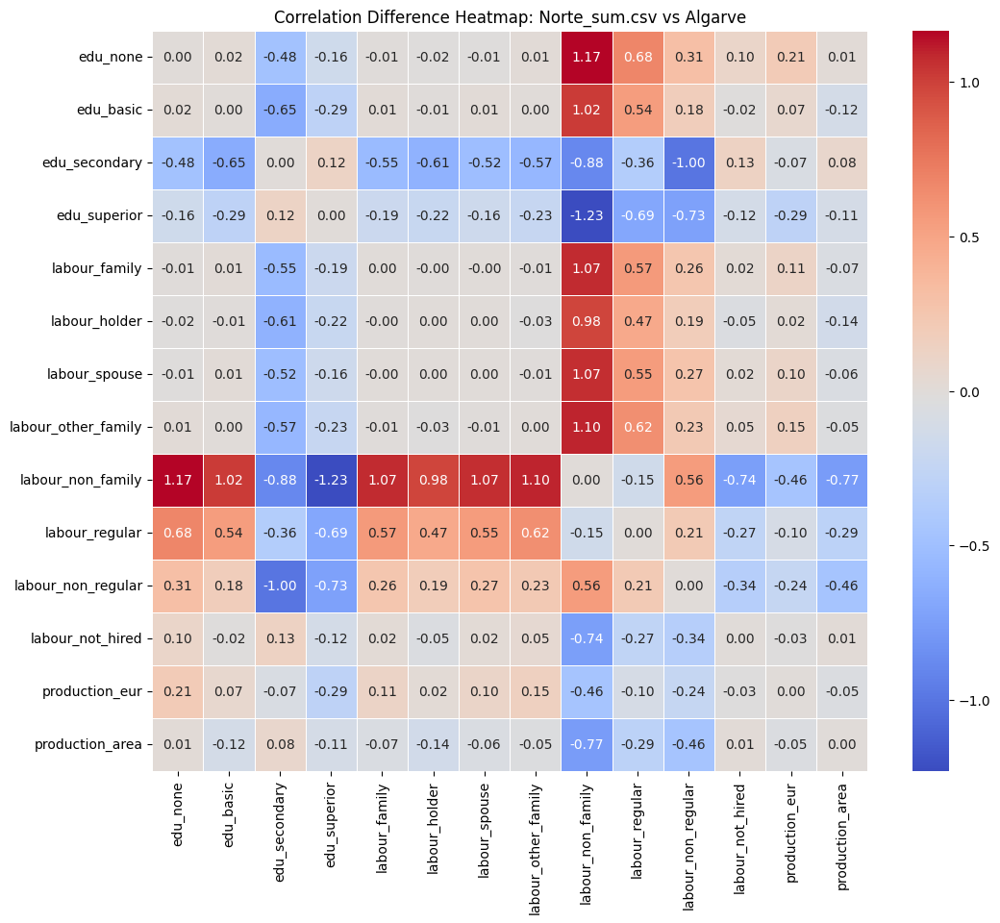

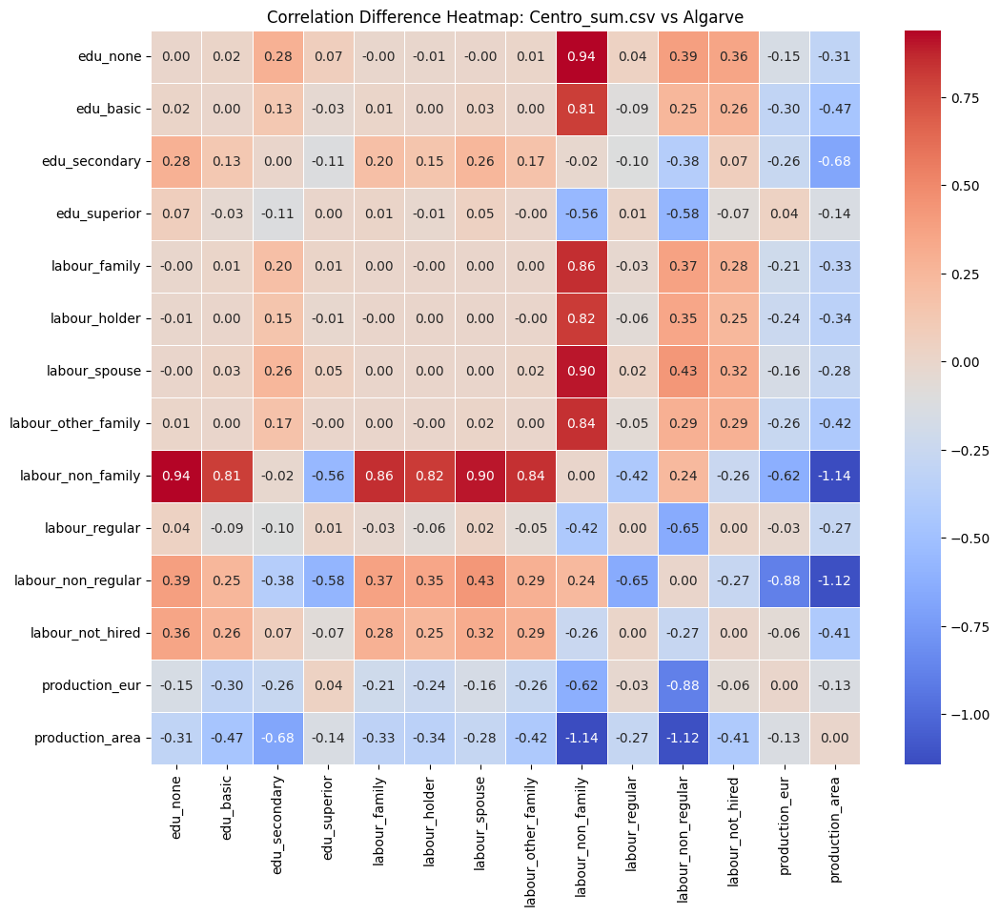

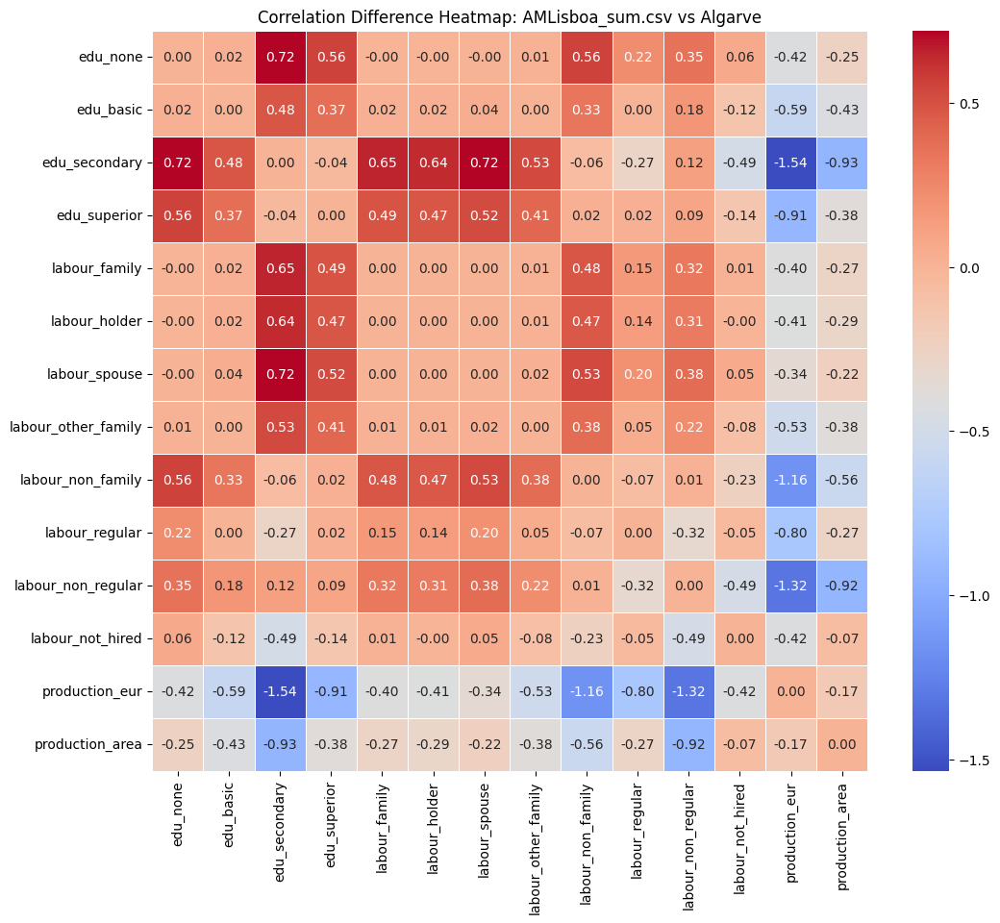

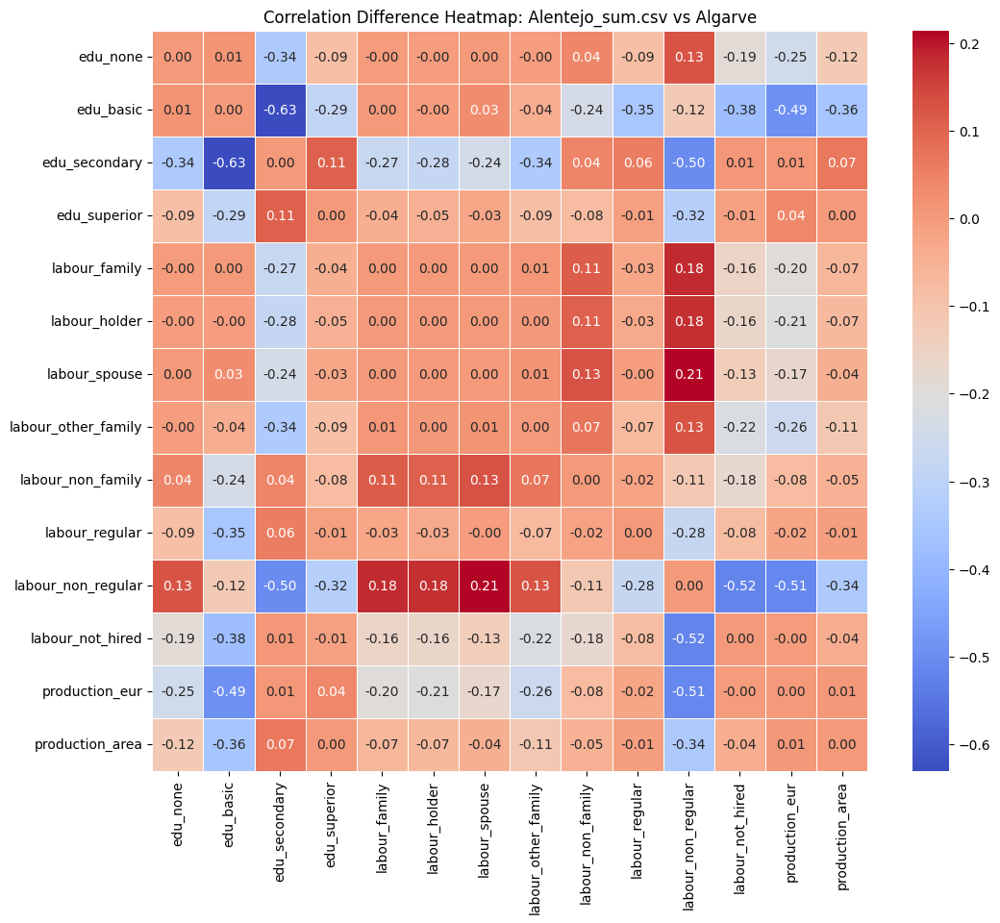

In [61]:
# Load the datasets
files = ['Norte_sum.csv', 'Centro_sum.csv', 'AMLisboa_sum.csv', 'Alentejo_sum.csv', 'Algarve_sum.csv']
dataframes = {file: pd.read_csv(file) for file in files}

# Compute the correlation matrices excluding 'year' column
correlation_matrices = {file: df.drop(columns=['year']).corr() for file, df in dataframes.items()}

# Calculate the difference in correlation matrices (taking Norte as the reference)
reference_region = 'Algarve_sum.csv'
difference_matrices = {file: correlation_matrices[file] - correlation_matrices[reference_region] for file in files if file != reference_region}

# Plot the correlation difference heatmap for each region compared to Norte
for file, diff_matrix in difference_matrices.items():
    plt.figure(figsize=(12, 10))
    sns.heatmap(diff_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
    plt.title(f'Correlation Difference Heatmap: {file} vs Algarve')
    plt.show()

##### Alentejo

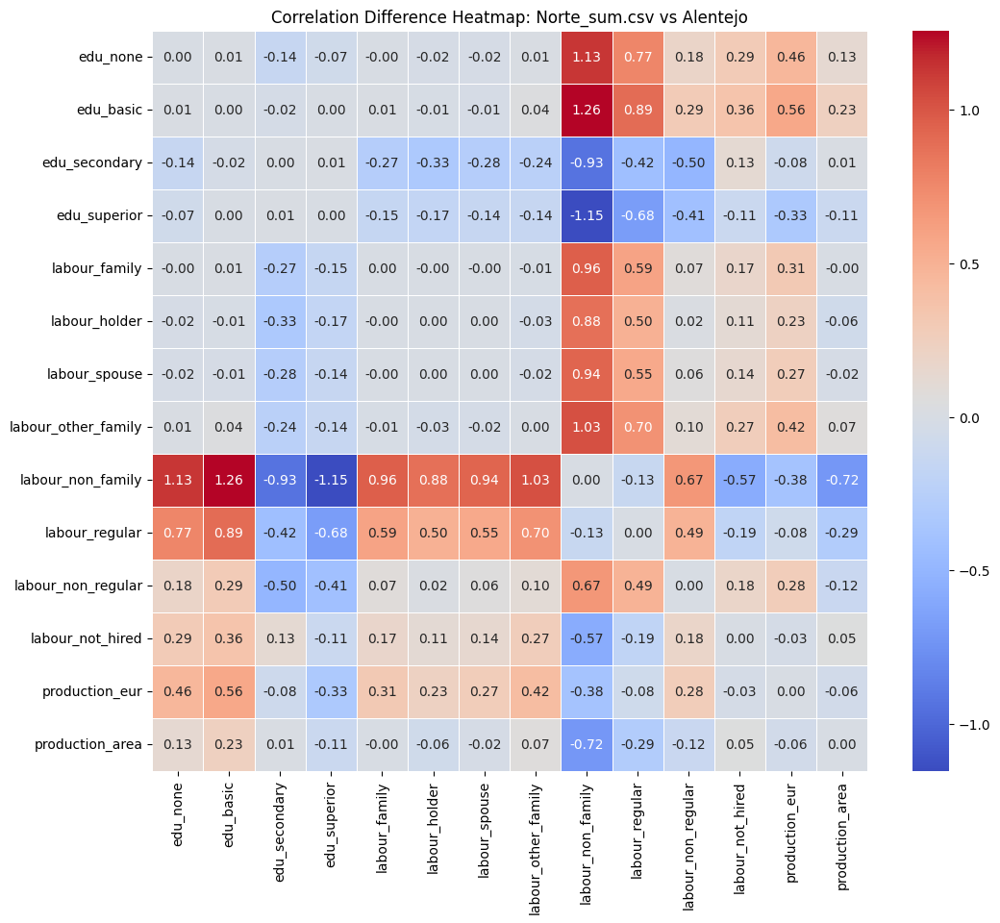

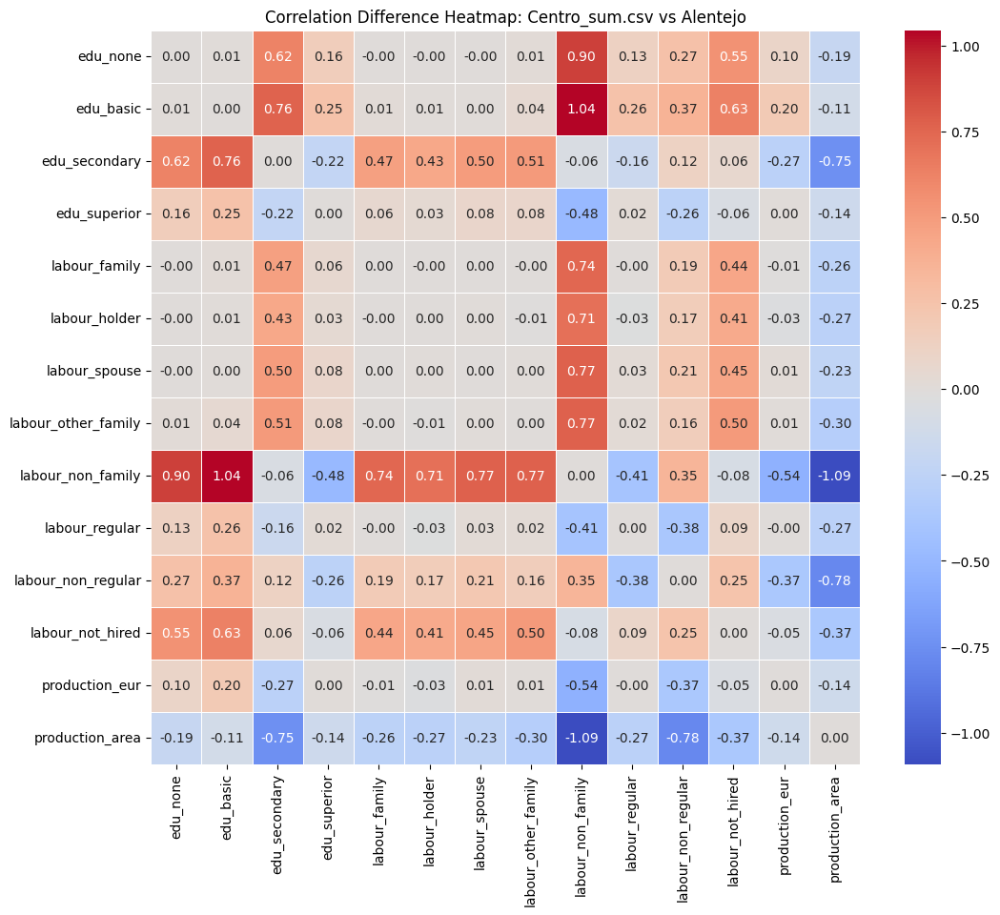

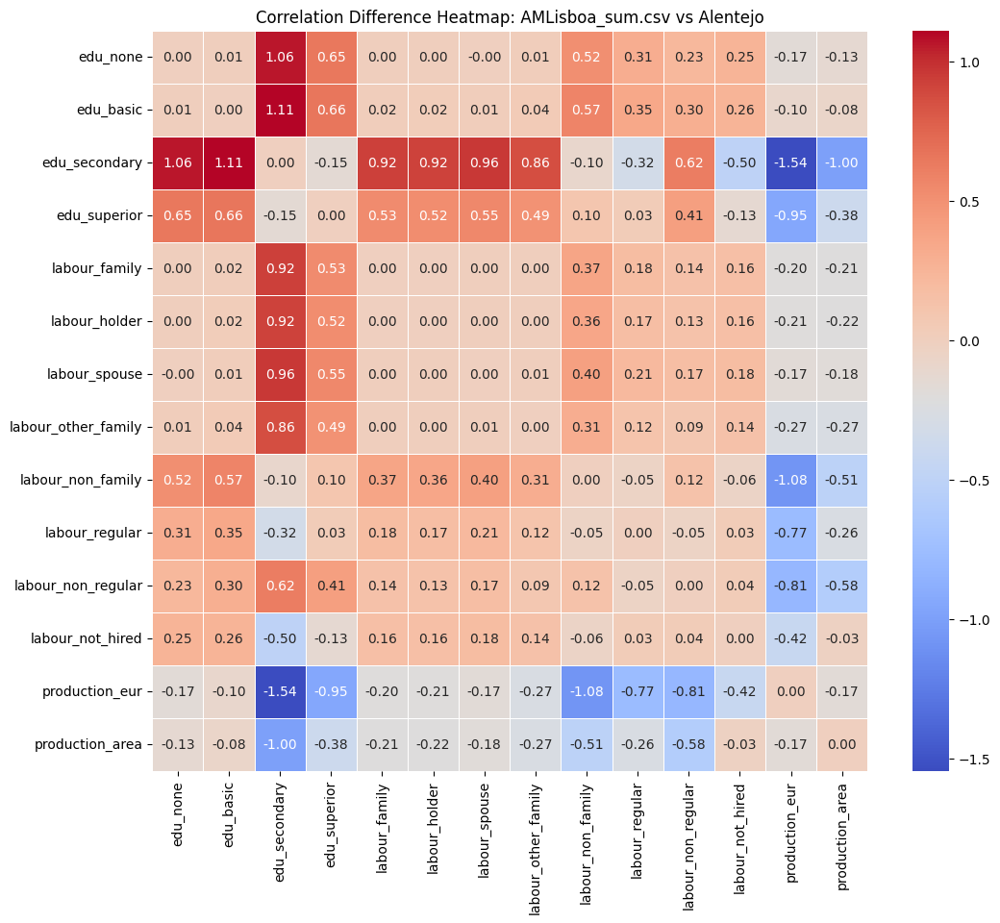

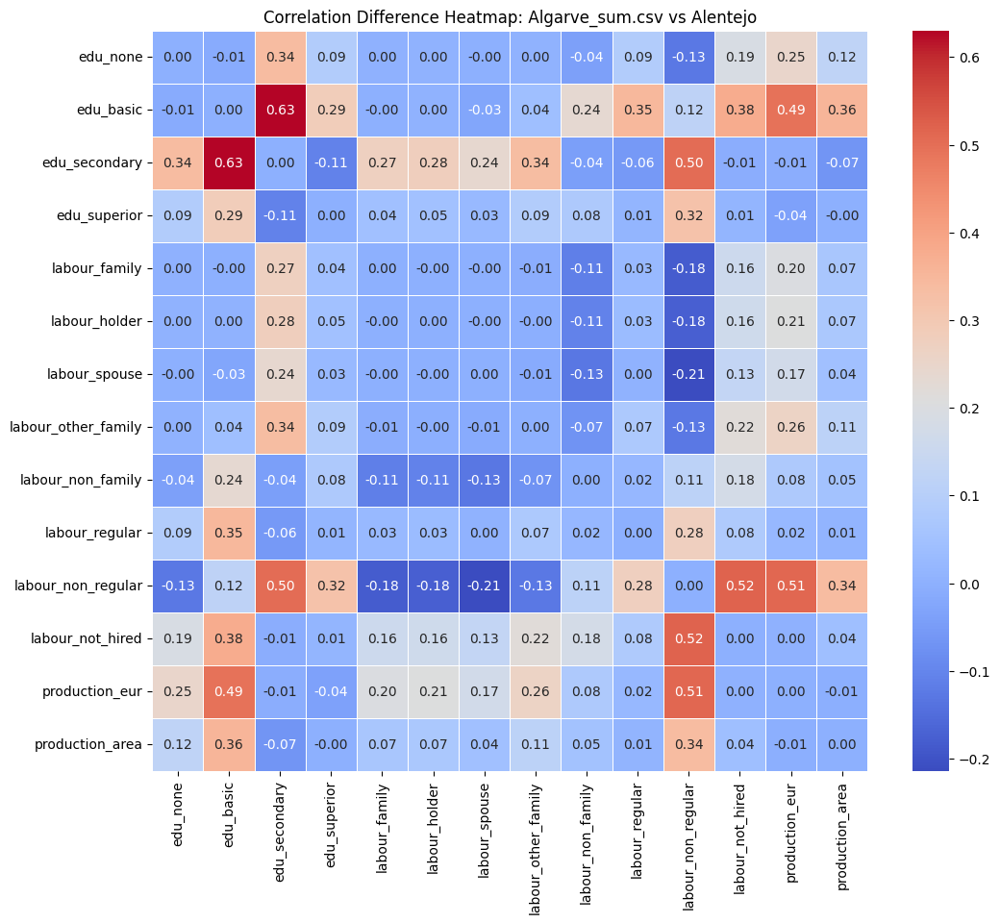

In [62]:
# Load the datasets
files = ['Norte_sum.csv', 'Centro_sum.csv', 'AMLisboa_sum.csv', 'Alentejo_sum.csv', 'Algarve_sum.csv']
dataframes = {file: pd.read_csv(file) for file in files}

# Compute the correlation matrices excluding 'year' column
correlation_matrices = {file: df.drop(columns=['year']).corr() for file, df in dataframes.items()}

# Calculate the difference in correlation matrices (taking Norte as the reference)
reference_region = 'Alentejo_sum.csv'
difference_matrices = {file: correlation_matrices[file] - correlation_matrices[reference_region] for file in files if file != reference_region}

# Plot the correlation difference heatmap for each region compared to Norte
for file, diff_matrix in difference_matrices.items():
    plt.figure(figsize=(12, 10))
    sns.heatmap(diff_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
    plt.title(f'Correlation Difference Heatmap: {file} vs Alentejo')
    plt.show()

##### Portugal

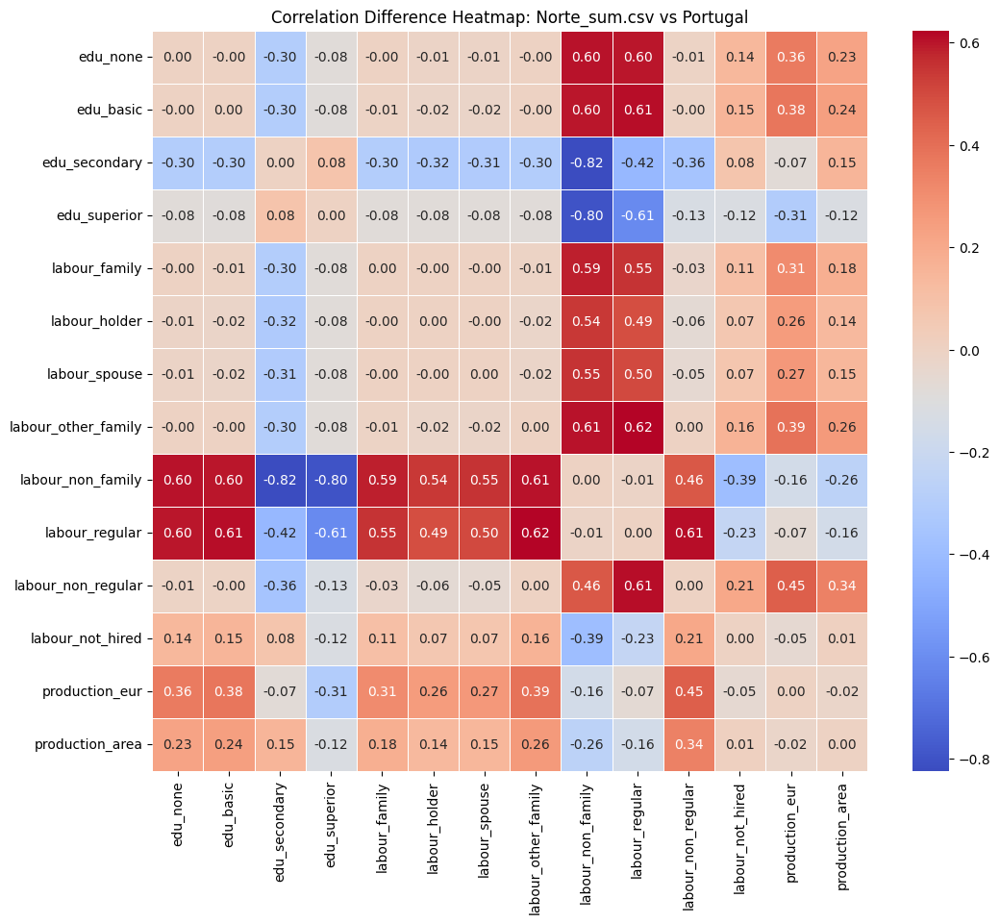

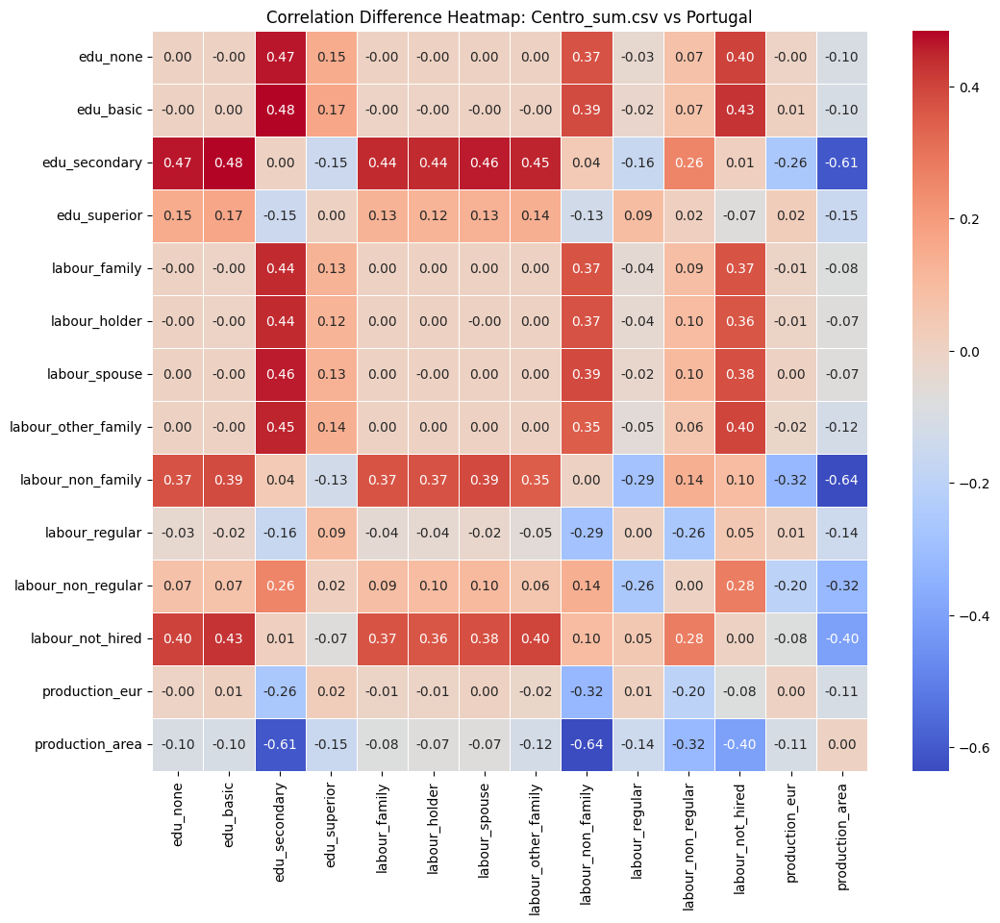

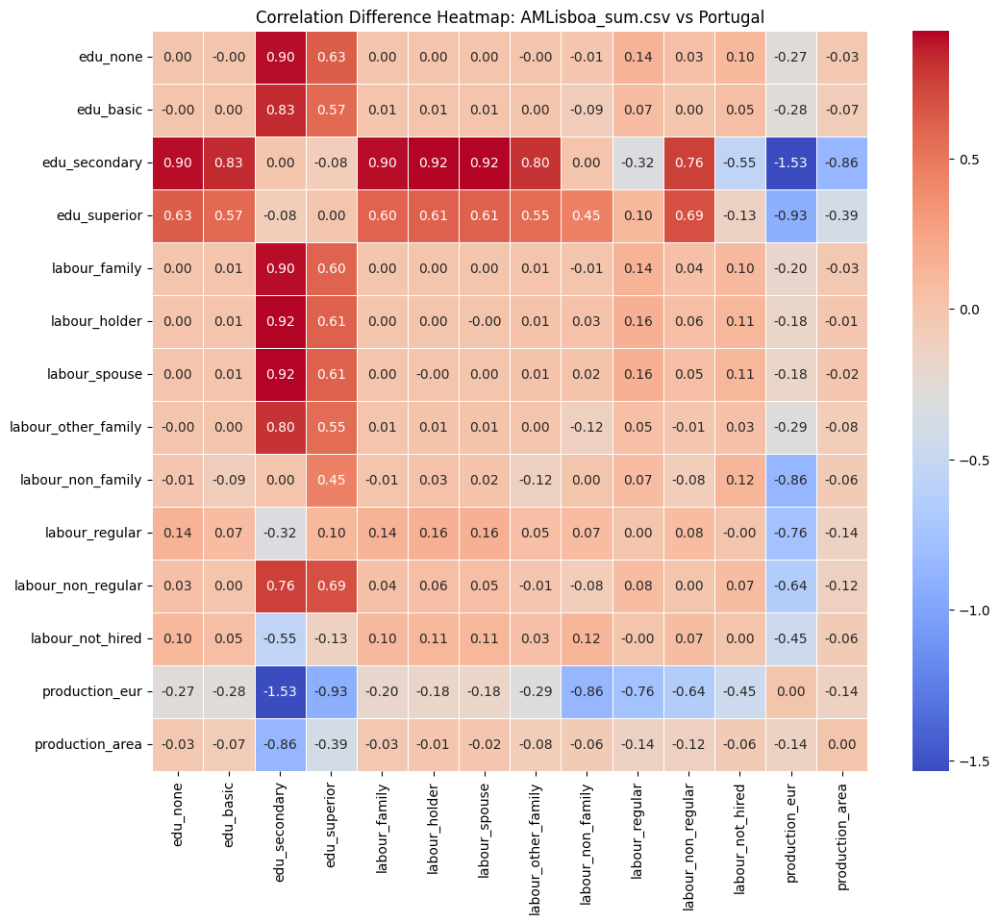

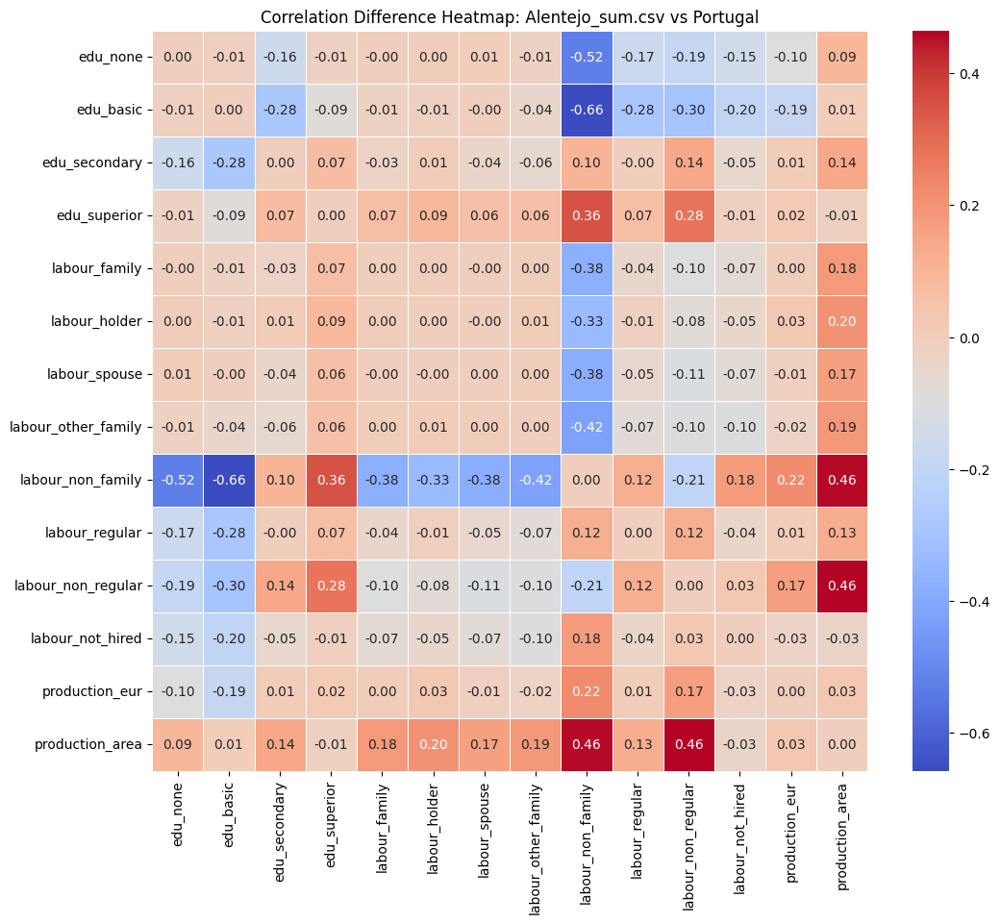

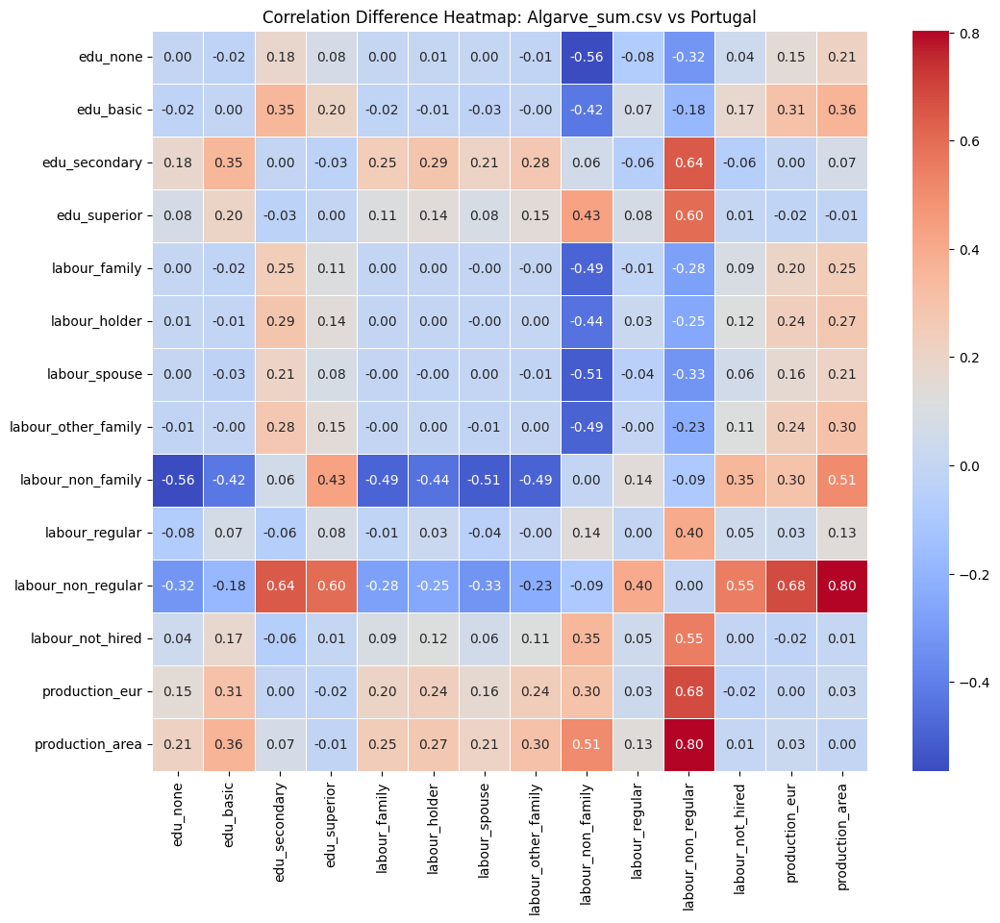

In [63]:
# Load the datasets
files = ['Norte_sum.csv', 'Centro_sum.csv', 'AMLisboa_sum.csv', 'Alentejo_sum.csv', 'Algarve_sum.csv', 'Portugal_sum.csv']
dataframes = {file: pd.read_csv(file) for file in files}

# Compute the correlation matrices excluding 'year' column
correlation_matrices = {file: df.drop(columns=['year']).corr() for file, df in dataframes.items()}

# Calculate the difference in correlation matrices (taking Norte as the reference)
reference_region = 'Portugal_sum.csv'
difference_matrices = {file: correlation_matrices[file] - correlation_matrices[reference_region] for file in files if file != reference_region}

# Plot the correlation difference heatmap for each region compared to Norte
for file, diff_matrix in difference_matrices.items():
    plt.figure(figsize=(12, 10))
    sns.heatmap(diff_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
    plt.title(f'Correlation Difference Heatmap: {file} vs Portugal')
    plt.show()

## Teste ANOVA e Regressão

### Produção em Euros

C:\Users\Damião\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\Damião\AppData\Local\Temp\ipykernel_1800\1397604041.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='F', y='Variable', data=anova_results_eur, palette="viridis")


                            OLS Regression Results                            
Dep. Variable:         production_eur   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     289.5
Date:                Fri, 21 Jun 2024   Prob (F-statistic):            0.00345
Time:                        17:32:34   Log-Likelihood:                -270.22
No. Observations:                  15   AIC:                             566.4
Df Residuals:                       2   BIC:                             575.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -1.241e+07   4

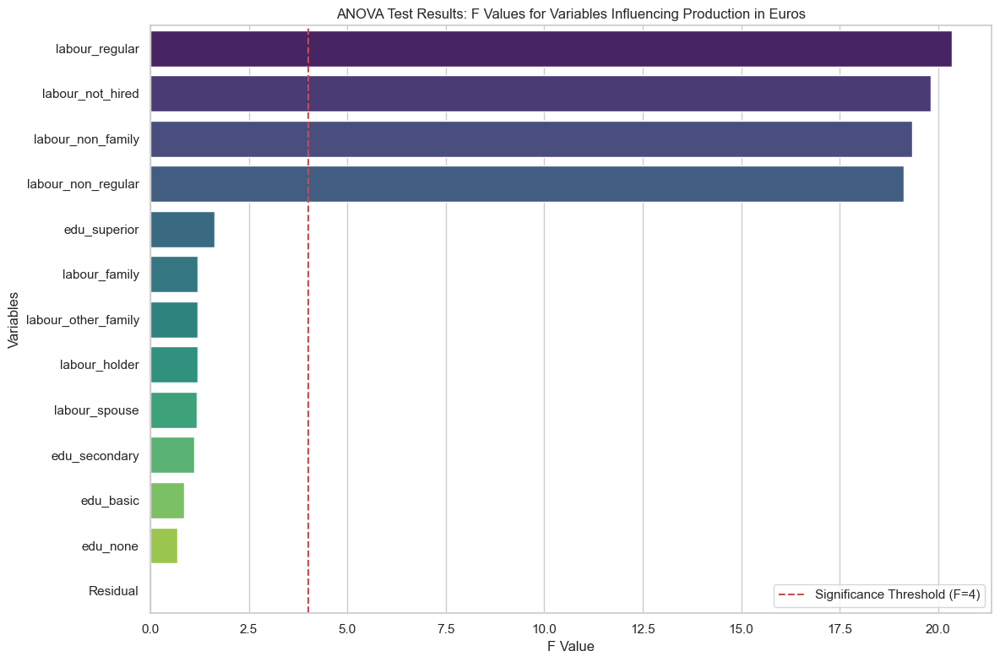

In [70]:


# Load the data from the CSV files
file_paths = [
    "Alentejo_sum.csv",
    "Algarve_sum.csv",
    "AMLisboa_sum.csv",
    "Centro_sum.csv",
    "Norte_sum.csv"
]

# Create a dictionary to hold the dataframes
dataframes = {}

# Load each file into a dataframe
for file_path in file_paths:
    region_name = file_path.split('/')[-1].split('_')[0]
    dataframes[region_name] = pd.read_csv(file_path)

# Combine all the dataframes into one
combined_df = pd.concat(dataframes.values(), ignore_index=True)

# Prepare the formula for the regression model on production_eur
formula_eur = 'production_eur ~ edu_none + edu_basic + edu_secondary + edu_superior + labour_family + labour_holder + labour_spouse + labour_other_family + labour_non_family + labour_regular + labour_non_regular + labour_not_hired'

# Fit the regression model
model_eur = ols(formula_eur, data=combined_df).fit()

# Print the summary of the regression model
print(model_eur.summary())

# Set the plot style
sns.set(style="whitegrid")

# Extract data for plotting
anova_results_eur = sm.stats.anova_lm(model_eur, typ=2).reset_index()
anova_results_eur = anova_results_eur.rename(columns={'index': 'Variable'})
anova_results_eur = anova_results_eur.sort_values(by='F', ascending=False)

# Plot the ANOVA results for production in euros
plt.figure(figsize=(12, 8))
sns.barplot(x='F', y='Variable', data=anova_results_eur, palette="viridis")

# Add labels and title
plt.xlabel('F Value')
plt.ylabel('Variables')
plt.title('ANOVA Test Results: F Values for Variables Influencing Production in Euros')
plt.axvline(x=4.0, color='r', linestyle='--', label='Significance Threshold (F=4)')
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


### Produção por area

C:\Users\Damião\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\Damião\AppData\Local\Temp\ipykernel_1800\3686037319.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='F', y='Variable', data=anova_results_area, palette="viridis")


                            OLS Regression Results                            
Dep. Variable:        production_area   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     378.4
Date:                Fri, 21 Jun 2024   Prob (F-statistic):            0.00264
Time:                        17:34:28   Log-Likelihood:                -180.01
No. Observations:                  15   AIC:                             386.0
Df Residuals:                       2   BIC:                             395.2
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            6211.9307   1

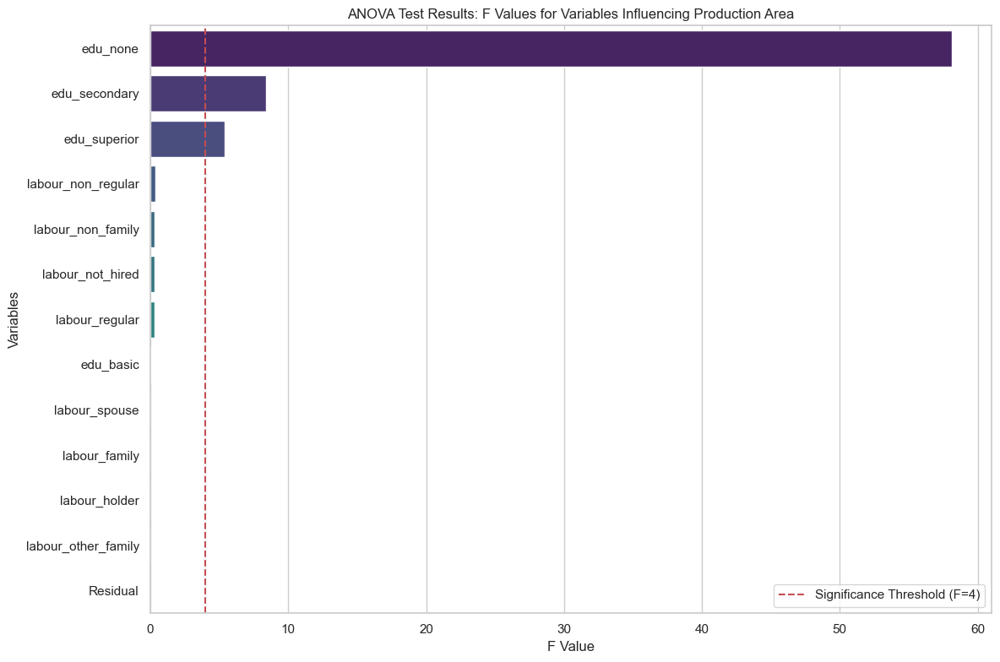

In [71]:
# Load the data from the CSV files
file_paths = [
    "Alentejo_sum.csv",
    "Algarve_sum.csv",
    "AMLisboa_sum.csv",
    "Centro_sum.csv",
    "Norte_sum.csv"
]

# Create a dictionary to hold the dataframes
dataframes = {}

# Load each file into a dataframe
for file_path in file_paths:
    region_name = file_path.split('/')[-1].split('_')[0]
    dataframes[region_name] = pd.read_csv(file_path)

# Combine all the dataframes into one
combined_df = pd.concat(dataframes.values(), ignore_index=True)

# Prepare the formula for the regression model on production_area
formula_area = 'production_area ~ edu_none + edu_basic + edu_secondary + edu_superior + labour_family + labour_holder + labour_spouse + labour_other_family + labour_non_family + labour_regular + labour_non_regular + labour_not_hired'

# Fit the regression model
model_area = ols(formula_area, data=combined_df).fit()

# Print the summary of the regression model
print(model_area.summary())

# Set the plot style
sns.set(style="whitegrid")

# Extract data for plotting
anova_results_area = sm.stats.anova_lm(model_area, typ=2).reset_index()
anova_results_area = anova_results_area.rename(columns={'index': 'Variable'})
anova_results_area = anova_results_area.sort_values(by='F', ascending=False)

# Plot the ANOVA results for production area
plt.figure(figsize=(12, 8))
sns.barplot(x='F', y='Variable', data=anova_results_area, palette="viridis")

# Add labels and title
plt.xlabel('F Value')
plt.ylabel('Variables')
plt.title('ANOVA Test Results: F Values for Variables Influencing Production Area')
plt.axvline(x=4.0, color='r', linestyle='--', label='Significance Threshold (F=4)')
plt.legend()

# Show plot
plt.tight_layout()
plt.show()
